## SIRX MODEL EQUATIONS

$$\begin{align}
\frac{dS}{dt} & =  -\beta (1 + b \cos(t - \phi)) (1 - x \epsilon) SI \\
\frac{dI}{dt}  & =   \beta (1 + b \cos(t - \phi)) (1 - x \epsilon) SI - \gamma I \\
\frac{dR}{dt} &=  \gamma I  \\
\frac{dx}{dt} &=  \kappa x (1-x) (I {exp}(-\lambda t) - c ) \\
\frac{dC}{dt}  &=   \beta(1 + b \cos (t - \phi)) (1 - x \epsilon) SI
\end{align}$$

$$I_i(t) = \eta(t)^{-1} (C(t) - C(t-1))$$

$\eta(t) $ is defined as above using the estimated values for $\eta_0, \eta_1$ and testing rate data. 

 Import Packages

In [1]:
'''Import packages to be used'''
import numpy as np
import matplotlib.pyplot as plt
from numpy import (random, square, array, concatenate, diff, arange,mean, absolute, empty, ones, cos, pi, multiply, isnan, invert, nan,
                   exp, nan_to_num)
from scipy.integrate import solve_ivp
import os
import pandas as pd
import seaborn as sns

from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

import scipy.stats as stats
import time

In [5]:
cutoff = {'austriaAvg.csv': 200,'belarusAvg.csv': 230,'belgiumAvg.csv': 220,'bosniaAvg.csv': 200,'bulgariaAvg.csv': 200,
 'croatiaAvg.csv': 220, 'denmarkAvg.csv': 230,'finlandAvg.csv': 200,'franceAvg.csv': 200,'germanyAvg.csv': 200,
 'greeceAvg.csv': 200,'irelandAvg.csv': 200,'netherlandsAvg.csv': 200,'norwayAvg.csv': 200,'portugalAvg.csv': 200,
 'romaniaAvg.csv': 200,'serbiaAvg.csv': 200,'ukAvg.csv': 250,'switzerlandAvg.csv': 200}


Peaks_prediction = {'austriaAvg.csv': 261,'belarusAvg.csv': 263,'bosniaAvg.csv': 240,'bulgariaAvg.csv': 254,'belgiumAvg.csv': 233,
 'croatiaAvg.csv': 278,'denmarkAvg.csv': 296,'finlandAvg.csv': 267,'greeceAvg.csv': 263,'romaniaAvg.csv': 250,'franceAvg.csv': 209,
 'germanyAvg.csv': 257,'irelandAvg.csv': 238,'netherlandsAvg.csv': 245,'norwayAvg.csv': 266,'portugalAvg.csv': 260,
 'serbiaAvg.csv': 263,'switzerlandAvg.csv': 251,'ukAvg.csv': 241}

In [6]:
cutoff_peak = {'austriaAvg.csv': (8.962899999999999e-05, 31, '27-03-20'), 'belarusAvg.csv': (0.0001013123333333, 79, '17-05-20'), 
               'belgiumAvg.csv': (0.0001274758333333, 76, '20-04-20'), 'bosniaAvg.csv': (1.7318333333333333e-05, 60, '04-05-20'), 
               'bulgariaAvg.csv': (1.2933333333333334e-05, 97, '13-06-20'), 'croatiaAvg.csv': (1.9016666666666667e-05, 36, '01-04-20'), 
               'denmarkAvg.csv': (5.823333333333333e-05, 41, '08-04-20'), 'finlandAvg.csv': (2.9770000000000005e-05, 43, '09-04-20'), 
               'franceAvg.csv': (7.1022e-05, 37, '01-04-20'), 'germanyAvg.csv': (6.86e-05, 35, '31-03-20'), 'greeceAvg.csv': (9.245e-06, 36, '02-04-20'), 
               'irelandAvg.csv': (0.0002016086666666, 46, '15-04-20'), 'netherlandsAvg.csv': (1.3933333333333333e-05, 46, '13-04-20'), 
               'norwayAvg.csv': (5.113333333333333e-05, 32, '29-03-20'), 'portugalAvg.csv': (8.086250000000001e-05, 39, '10-04-20'), 
               'romaniaAvg.csv': (1.943333333333333e-05, 46, '12-04-20'), 'serbiaAvg.csv': (4.508333333333333e-05, 43, '18-04-20'), 
               'ukAvg.csv': (7.158333333333333e-05, 84, '24-04-20'), 'switzerlandAvg.csv': (0.0001318948333333, 28, '24-03-20')} 
pred_peak = {'austriaAvg.csv': (0.0008366273333333, 264, '15-11-20'), 'belarusAvg.csv': (0.0002047061666666, 291, '15-12-20'), 
             'belgiumAvg.csv': (0.0015559608333333, 270, '31-10-20'), 'bosniaAvg.csv': (0.0005158263333333, 248, '08-11-20'), 
             'bulgariaAvg.csv': (0.000538394, 258, '21-11-20'), 'croatiaAvg.csv': (0.0009600271666666, 292, '13-12-20'), 
             'denmarkAvg.csv': (0.0006289778333333, 296, '19-12-20'), 'finlandAvg.csv': (8.810083333333334e-05, 291, '13-12-20'), 
             'franceAvg.csv': (0.0011448329999999, 257, '07-11-20'), 'germanyAvg.csv': (0.0003137203333333, 298, '19-12-20'), 
             'greeceAvg.csv': (0.0002561308333333, 263, '15-11-20'), 'irelandAvg.csv': (0.0002379271666666, 236, '22-10-20'), 
             'netherlandsAvg.csv': (0.0001446955, 298, '21-12-20'), 'norwayAvg.csv': (0.0001287813333333, 265, '17-11-20'), 
             'portugalAvg.csv': (0.0006320503333333, 264, '21-11-20'), 'romaniaAvg.csv': (0.0004629195, 270, '22-11-20'), 
             'serbiaAvg.csv': (0.0008513049999999, 274, '05-12-20'), 'ukAvg.csv': (0.0005744115, 333, '29-12-20'), 
             'switzerlandAvg.csv': (0.0013523391666666, 251, '02-11-20')}

/var/folders/cl/zg6yj_d91r99vg4ns_fs7jf00000gn/T/ipykernel_40585/1176195948.py:1: DtypeWarning: Columns (3,4,5) have mixed types. Specify dtype option on import or set low_memory=False.
  data_mobility = pd.read_csv("Global_Mobility_Report.csv")


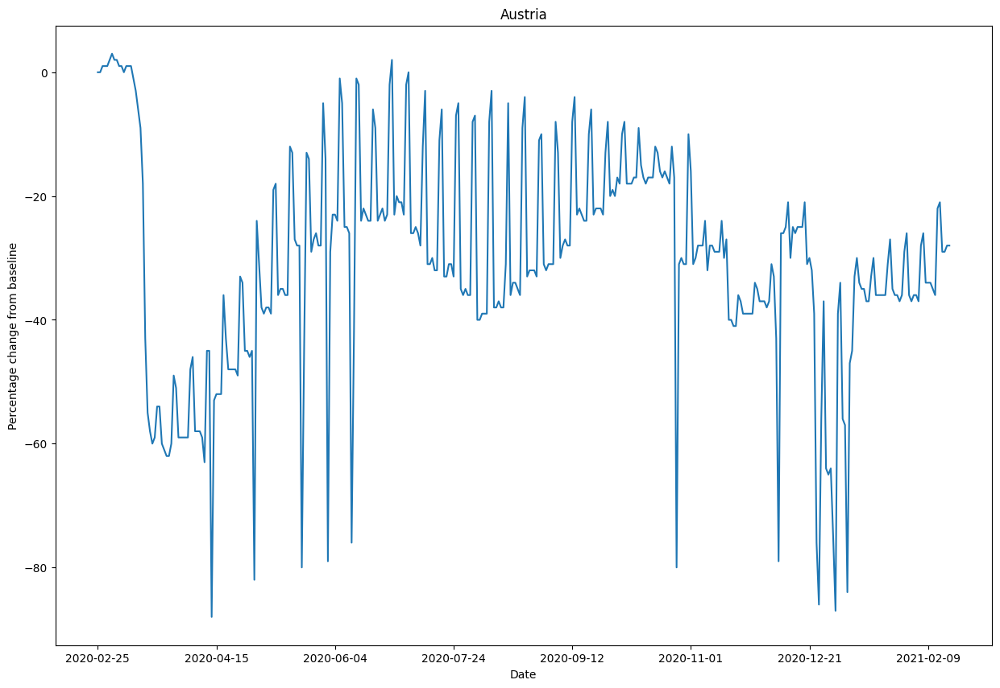

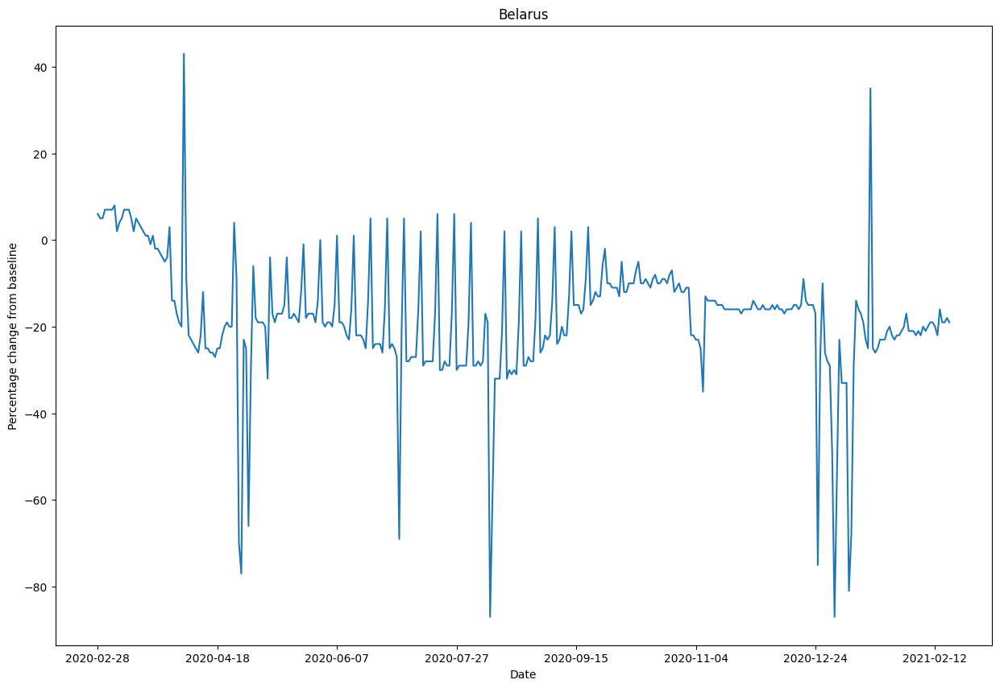

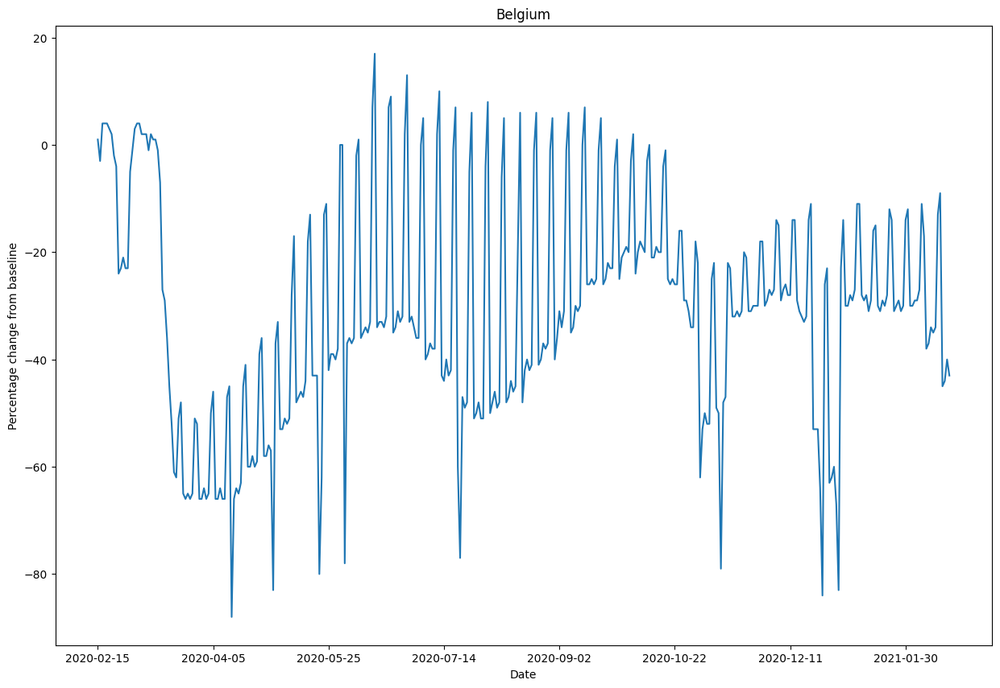

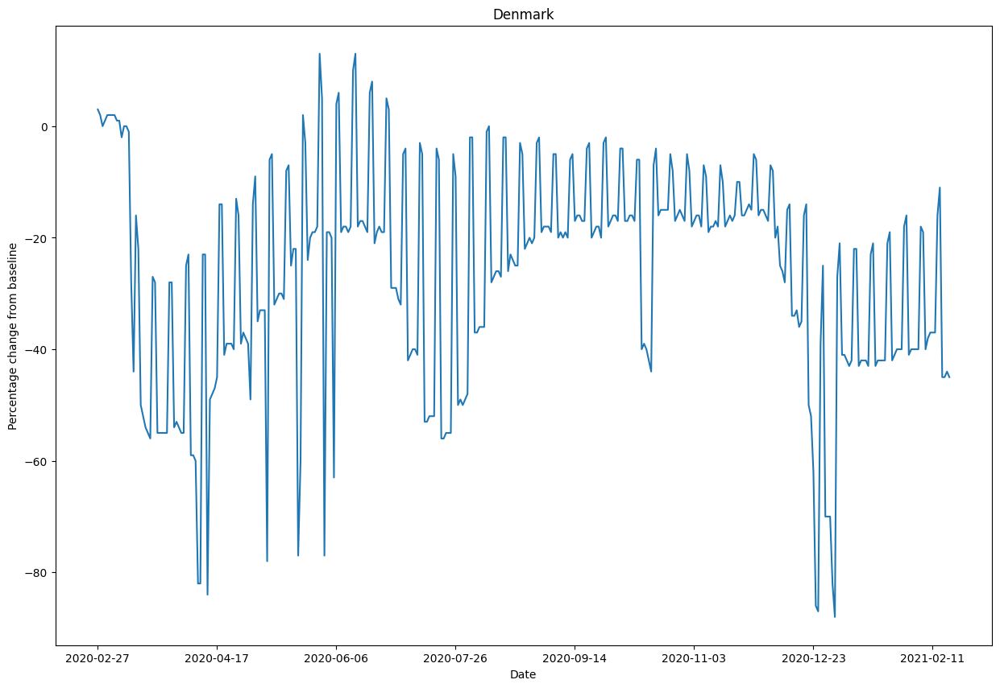

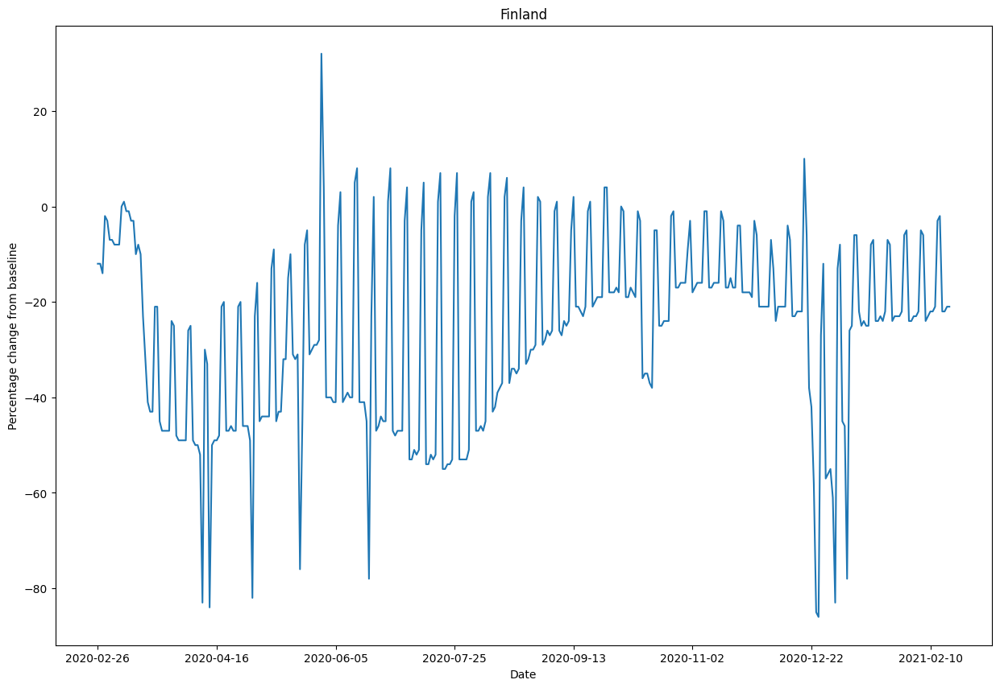

...

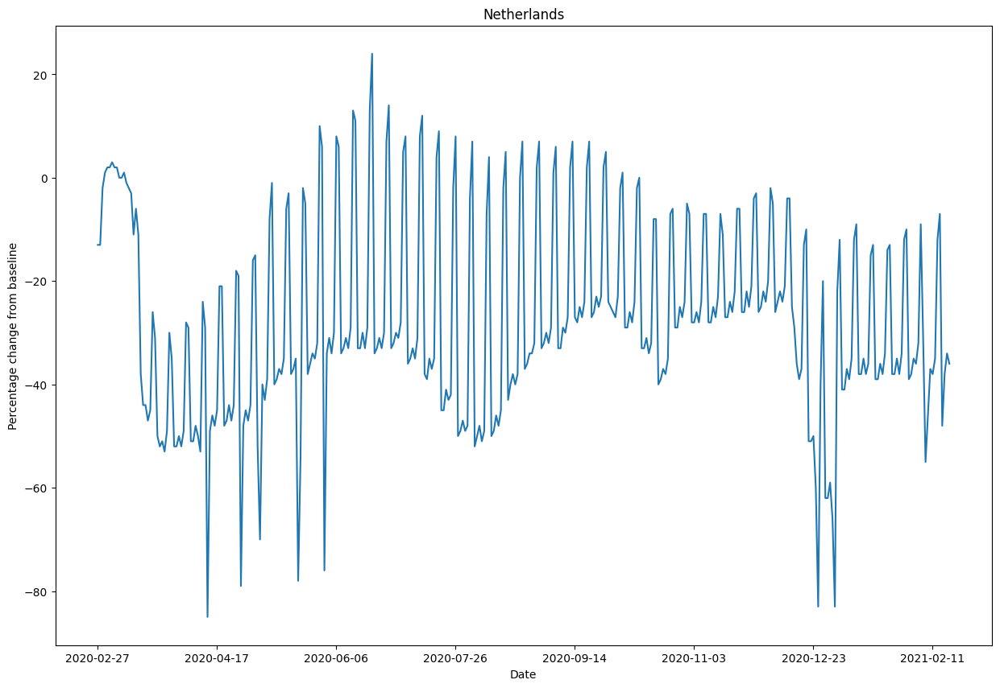

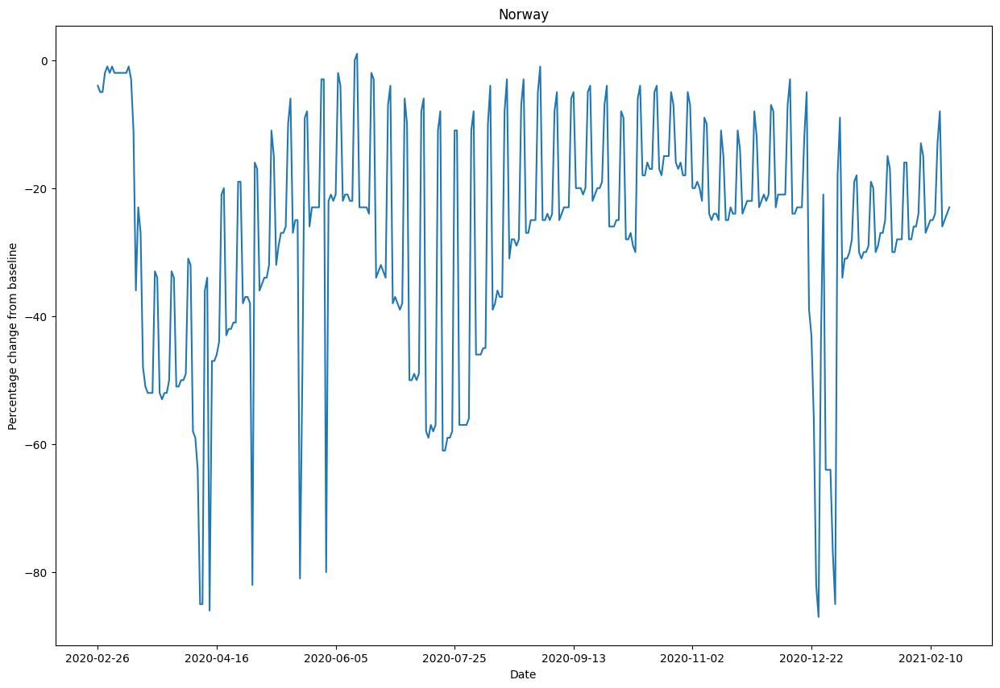

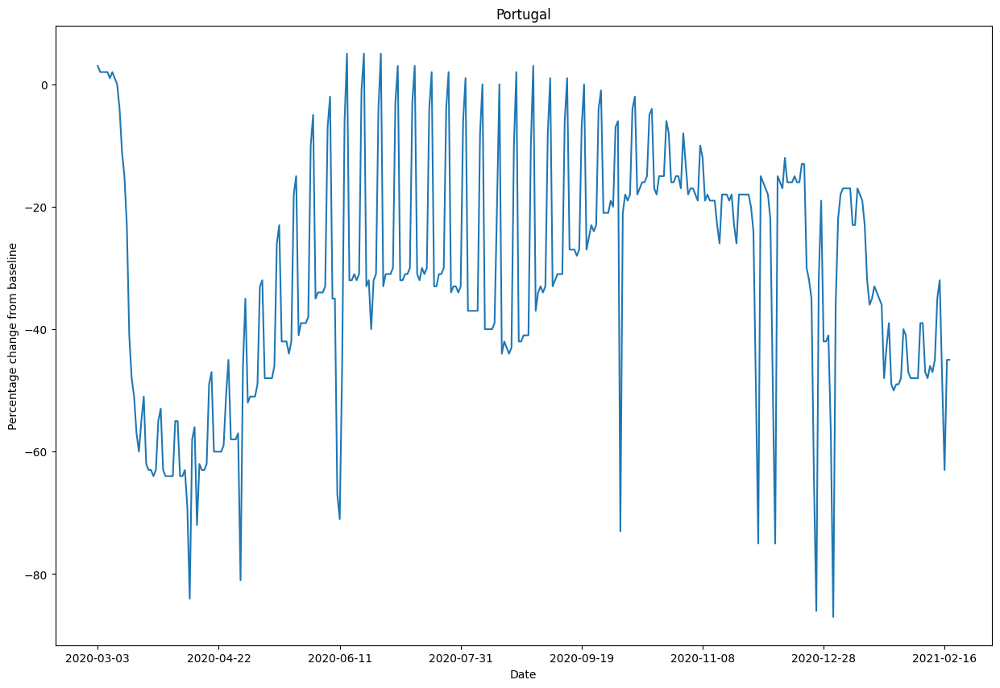

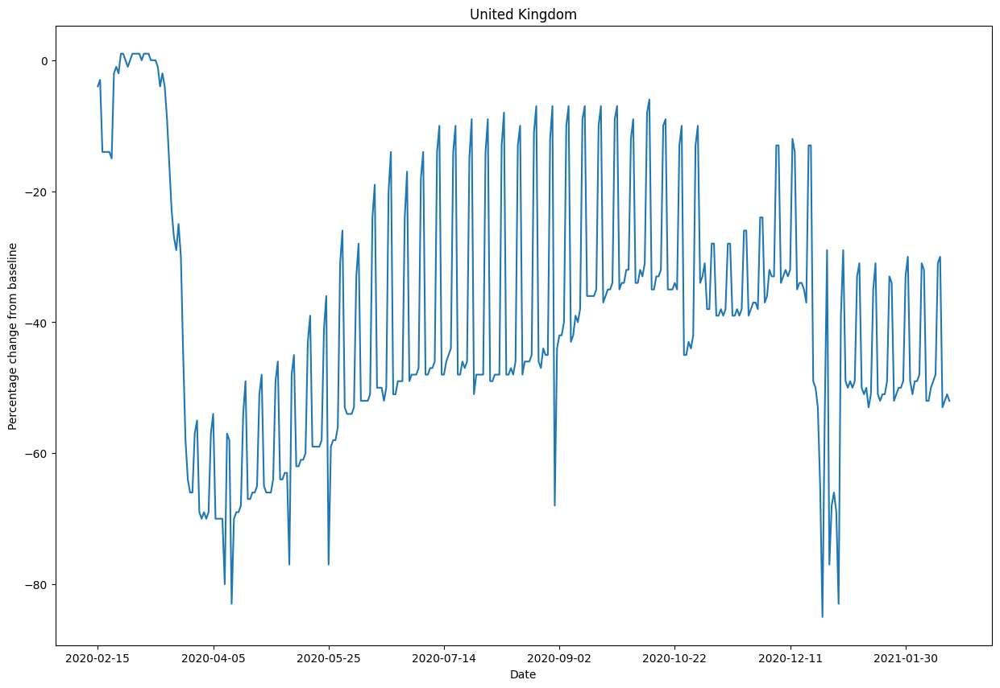

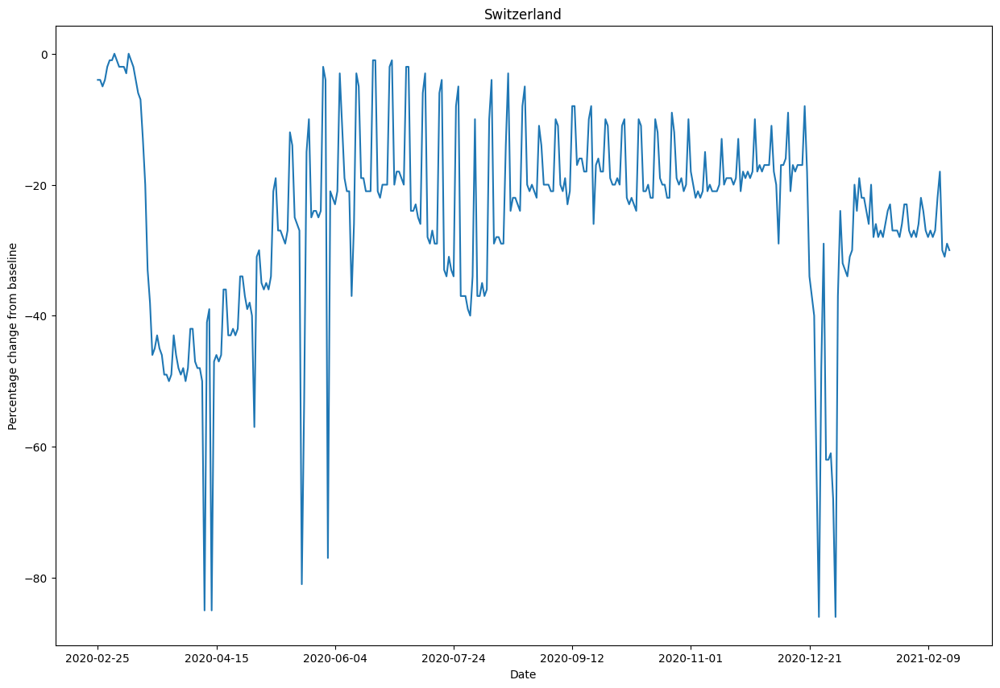

In [3]:
data_mobility = pd.read_csv("Global_Mobility_Report.csv")
data_mobility["country_region"].unique()
# print(data_mobility.columns)
Start_point = [10, 13, 0, 12, 11, 9, 10, 14, 12, 11, 17, 0, 10]

parameterErr = ["Austria","Belarus", "Belgium", "Bosnia and Herzegovina","Bulgaria","Croatia","Denmark",
                "Finland","France","Germany","Greece","Ireland","Netherlands","Norway","Portugal","Romania",
                "Serbia","United Kingdom","Switzerland"]
Set = [0,1,2,6,7,8,9,11,12,13,14,17,18]

for i in range(len(Set)):
    country = parameterErr[Set[i]]
    data_country = data_mobility[data_mobility["country_region"] == country].iloc[Start_point[i]:370]
    data_country = data_country[["country_region", "date", "retail_and_recreation_percent_change_from_baseline", 
                        "workplaces_percent_change_from_baseline", "residential_percent_change_from_baseline",
                        "grocery_and_pharmacy_percent_change_from_baseline", "parks_percent_change_from_baseline",
                        "transit_stations_percent_change_from_baseline"]]
    data_country = data_country.set_index("date")
    data_country["workplaces_percent_change_from_baseline"].plot(figsize = (15,10), title = country)
    plt.xlabel("Date")
    plt.ylabel("Percentage change from baseline")
    plt.show()

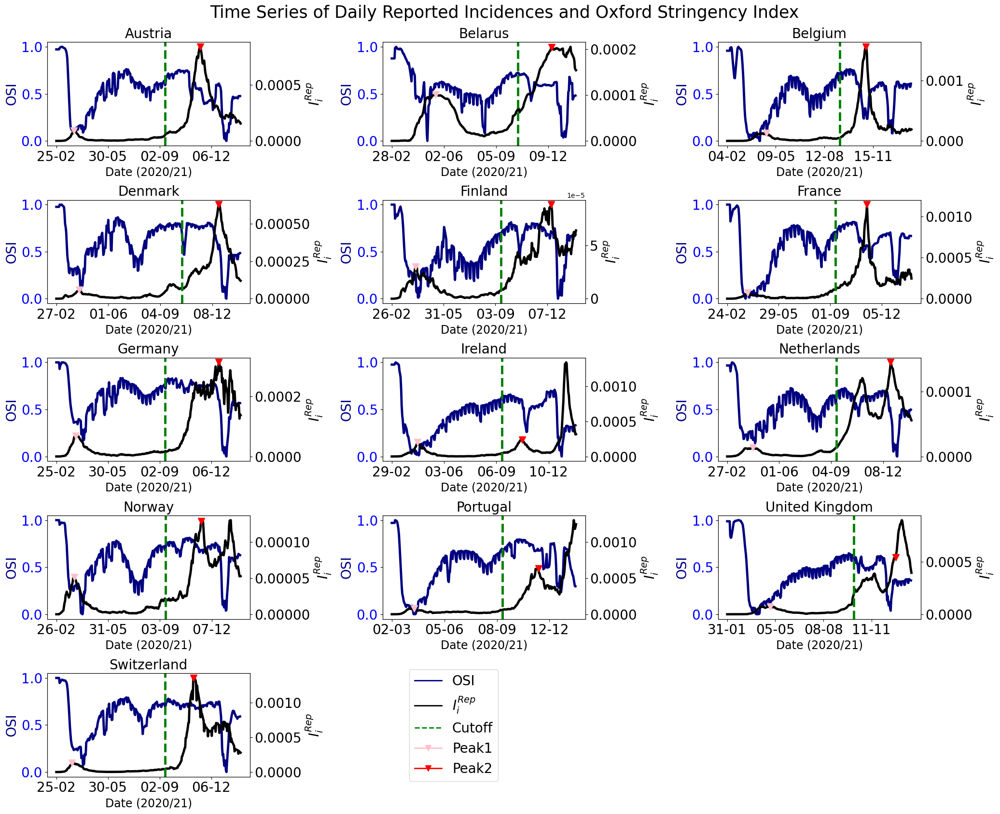

Completed!


In [7]:
Country_path_old = os.getcwd() + '/Countries'

parameterErr = ["Austria","Belarus", "Belgium", "Bosnia and Herzegovina","Bulgaria","Croatia","Denmark",
                "Finland","France","Germany","Greece","Ireland","Netherlands","Norway","Portugal","Romania",
                "Serbia","United Kingdom","Switzerland"]

parameterErr1 = ["austriaAvg.csv","belarusAvg.csv", "belgiumAvg.csv", "bosniaAvg.csv","bulgariaAvg.csv","croatiaAvg.csv",
                "denmarkAvg.csv","finlandAvg.csv","franceAvg.csv","germanyAvg.csv","greeceAvg.csv","irelandAvg.csv",
                "netherlandsAvg.csv","norwayAvg.csv","portugalAvg.csv","romaniaAvg.csv","serbiaAvg.csv","ukAvg.csv","switzerlandAvg.csv"]

Start_point_test = [43, 11, 33, 34, 41, 14, 0, 8, 86, 26, 13, 25, 102, 42, 6, 37, 0, 67, 95]
Set = [0,1,2,6,7,8,9,11,12,13,14,17,18] 

# Create a figure with subplots
num_countries = len(Set)  # Assuming Set contains the countries to be plotted
ncols = 3  # Number of columns for the subplot grid
nrows = 5  # Number of rows to fit all subplots (round up)
print(enumerate(Set))

colors = ['navy', 'black', 'green' ,'pink', 'red' ]
linestyles = ['solid', 'solid', 'dashed', None, None]  # use valid linestyles
markers = [None, None, None, 'v', 'v']
Da = ["OSI", "$I_i^{Rep}$", "Cutoff" , "Peak1", "Peak2"]


fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(21, 17))  # Adjust figsize based on number of panels

axes = axes.flatten()  # Flatten axes array for easier iteration


for i, j in enumerate(Set): # Loop over each country/parameter
    ax = axes[i]  # Get the current axis in the grid
    
    # Fetch and process data
    country_covid_old = pd.read_csv(Country_path_old + "/" + parameterErr1[j][:-4] + "_updated.csv")
    dataosi = pd.read_csv(Country_path_old + "/" + parameterErr1[j][:-7] + "osi_updated.csv")
    data_country = data_mobility[data_mobility["country_region"] == parameterErr[j]].iloc[Start_point[i]:370]
    data_dates = data_country[["date"]]
    data_country = data_country[["workplaces_percent_change_from_baseline"]]
    
    country_covid_old['date'] = pd.to_datetime(country_covid_old["date"])
    date = country_covid_old['date'].dt.strftime('%d-%m')
    date = date[:].tolist()
    # print(parameterErr[j], date[0],data_dates.iloc[0][0])
    N = len(country_covid_old.index)
    Cutoff = cutoff[parameterErr1[j]]
    
    data = country_covid_old['new_cases'].tolist()
    data_normalised = [(i - min(data)) / (max(data) - min(data)) for i in data]
    data_average = np.zeros(N + 1)
    dataosi_average = np.zeros(N + 1)
    
    for t in range(6, N + 1):
        data_average[t] = np.mean(data[t - 6:t])
        dataosi_average[t] = np.mean(data_country[data_country.columns[-1]][t - 6:t])
    data_average_normalised = [(i - min(data_average)) / (max(data_average) - min(data_average)) for i in data_average]
    dataosi_average_normalised = [(i - min(dataosi_average)) / (max(dataosi_average) - min(dataosi_average)) for i in dataosi_average]
    data_convert = pd.DataFrame(dataosi_average_normalised, columns=["Work_places"])
    data_convert.to_csv(parameterErr1[j][:-4] + "google_mobility.csv", index=False)


    Cutoff_peak_value = max(data_average[:Cutoff-100])
    Cutoff_Peak = []
    for f in range(Cutoff-100):
        if data_average[f] ==  Cutoff_peak_value:
            Cutoff_Peak.append((Cutoff_peak_value, f))
    
    W = N-30
    Pred_peak_value = max(data_average[Cutoff:W])
    Pred_Peak = []
    for p in range(Cutoff,W):
        if data_average[p] ==  Pred_peak_value:
            Pred_Peak.append((Pred_peak_value, p))

    # Plot the data for this country on the correct axis
    ax.plot(dataosi_average_normalised[:N], label="OSI", color="navy", linewidth=3.5)

    title = parameterErr1[j][:-7].capitalize()
    if parameterErr1[j][:-7] == "uk":
       title = "United Kingdom" 
    ax.set_title(title, fontsize=20)
    ax.set_ylabel("OSI", color="navy", fontsize=20)
    ax.set_xlabel("Date (2020/21)", fontsize=17)
    ax.tick_params(axis='y', labelcolor="blue", labelsize = 20)
    
    ax2 = ax.twinx()
    ax2.set_ylabel("$I_i^{Rep}$", color="k", fontsize=20)
    ax2.plot(data_average[:N+1], label="$I_i^{Rep}$", color="k", linewidth=3.5)
    # ax2.plot(data_average_normalised[:], label="$I_i^{Rep}$", color="k", linewidth=3.5)
    ax2.tick_params(axis='y', labelcolor="k", labelsize = 20)
    ax2.plot(Cutoff_Peak[0][1], Cutoff_Peak[0][0], "v", color = "pink", markersize = 10.5, label = "Peak1")
    ax2.plot(Pred_Peak[0][1], Pred_Peak[0][0], "v", color = "red", markersize = 10.5, label = "Peak2")
    ax.set_xticks(np.arange(0, N, 95), date[0: N: 95] , fontsize = 20)
    ax2.axvline(x=Cutoff, color='g', linestyle = "dashed", linewidth=3.5, label = "Cutoff")
    
for i in range(num_countries, len(axes)):
    axes[i].axis('off')

delta_handles = [plt.Line2D([0], [0], color=c, lw=2, linestyle=ls, marker=m, markersize=8)
    for c, ls, m in zip(colors, linestyles, markers)]
fig.legend(delta_handles, Da , loc='lower center', bbox_to_anchor=(0.45, 0.035), fontsize=20, title_fontsize='x-large')


# Set a global title for the figure
plt.suptitle("Time Series of Daily Reported Incidences and Oxford Stringency Index", y=0.99, fontsize=25)

plt.tight_layout()

# plt.savefig("Selected_Countries1.jpeg", dpi = 300) # Save the figure as a .jpg file

plt.show()

print("Completed!")


### PLOTS DATA POINTS FOR INCIDENCE AND BEHAVIOUR WITH DATES

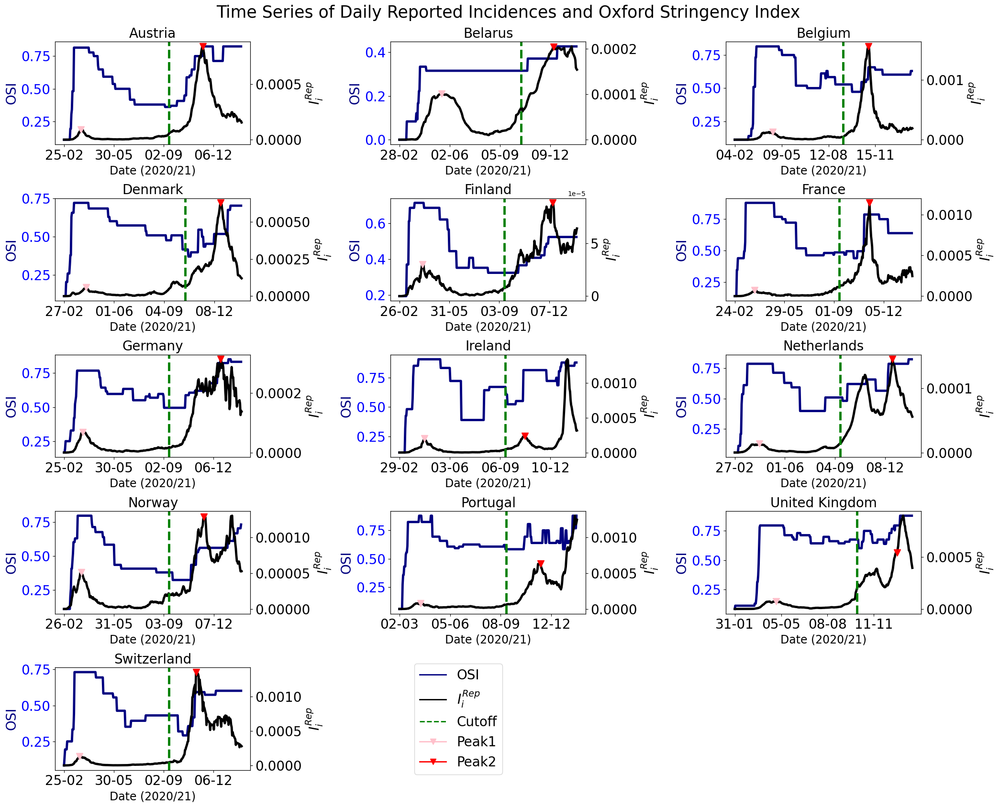

Completed!


In [12]:
Country_path_old = os.getcwd() + '/Countries'

parameterErr = ["Austria","Belarus", "Belgium", "Bosnia and Herzegovina","Bulgaria","Croatia","Denmark",
                "Finland","France","Germany","Greece","Ireland","Netherlands","Norway","Portugal","Romania",
                "Serbia","United Kingdom","Switzerland"]

parameterErr1 = ["austriaAvg.csv","belarusAvg.csv", "belgiumAvg.csv", "bosniaAvg.csv","bulgariaAvg.csv","croatiaAvg.csv",
                "denmarkAvg.csv","finlandAvg.csv","franceAvg.csv","germanyAvg.csv","greeceAvg.csv","irelandAvg.csv",
                "netherlandsAvg.csv","norwayAvg.csv","portugalAvg.csv","romaniaAvg.csv","serbiaAvg.csv","ukAvg.csv","switzerlandAvg.csv"]

Start_point_test = [43, 11, 33, 34, 41, 14, 0, 8, 86, 26, 13, 25, 102, 42, 6, 37, 0, 67, 95]
Set = [0,1,2,6,7,8,9,11,12,13,14,17,18] 

# Create a figure with subplots
num_countries = len(Set)  # Assuming Set contains the countries to be plotted
ncols = 3  # Number of columns for the subplot grid
nrows = 5  # Number of rows to fit all subplots (round up)
print(enumerate(Set))

colors = ['navy', 'black', 'green' ,'pink', 'red' ]
linestyles = ['solid', 'solid', 'dashed', None, None]  # use valid linestyles
markers = [None, None, None, 'v', 'v']
Da = ["OSI", "$I_i^{Rep}$", "Cutoff" , "Peak1", "Peak2"]


fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(21, 17))  # Adjust figsize based on number of panels

axes = axes.flatten()  # Flatten axes array for easier iteration


for i, j in enumerate(Set): # Loop over each country/parameter
    ax = axes[i]  # Get the current axis in the grid
    
    # Fetch and process data
    country_covid_old = pd.read_csv(Country_path_old + "/" + parameterErr1[j][:-4] + "_updated.csv")
    dataosi = pd.read_csv(Country_path_old + "/" + parameterErr1[j][:-7] + "osi_updated.csv")
    
    country_covid_old['date'] = pd.to_datetime(country_covid_old["date"])
    date = country_covid_old['date'].dt.strftime('%d-%m')
    date = date[:].tolist()
    N = len(country_covid_old.index)
    Cutoff = cutoff[parameterErr1[j]]
    
    data = country_covid_old['new_cases'].tolist()
    data_normalised = [(i - min(data)) / (max(data) - min(data)) for i in data]
    data_average = np.zeros(N + 1)
    dataosi_average = np.zeros(N + 1)
    
    for t in range(6, N + 1):
        data_average[t] = np.mean(data[t - 6:t])
        dataosi_average[t] = np.mean(dataosi[dataosi.columns[-1]][t - 6:t])
    data_average_normalised = [(i - min(data_average)) / (max(data_average) - min(data_average)) for i in data_average]
    
    Cutoff_peak_value = max(data_average[:Cutoff-100])
    Cutoff_Peak = []
    for f in range(Cutoff-100):
        if data_average[f] ==  Cutoff_peak_value:
            Cutoff_Peak.append((Cutoff_peak_value, f))
    
    W = N-30
    Pred_peak_value = max(data_average[Cutoff:W])
    Pred_Peak = []
    for p in range(Cutoff,W):
        if data_average[p] ==  Pred_peak_value:
            Pred_Peak.append((Pred_peak_value, p))

    # Plot the data for this country on the correct axis
    ax.plot(dataosi[dataosi.columns[-1]][:N], label="OSI", color="navy", linewidth=3.5)
    
    title = parameterErr1[j][:-7].capitalize()
    if parameterErr1[j][:-7] == "uk":
       title = "United Kingdom" 
    ax.set_title(title, fontsize=20)
    ax.set_ylabel("OSI", color="navy", fontsize=20)
    ax.set_xlabel("Date (2020/21)", fontsize=17)
    ax.tick_params(axis='y', labelcolor="blue", labelsize = 20)
    
    ax2 = ax.twinx()
    ax2.set_ylabel("$I_i^{Rep}$", color="k", fontsize=20)
    ax2.plot(data_average[:N+1], label="$I_i^{Rep}$", color="k", linewidth=3.5)
    # ax2.plot(data_average_normalised[:], label="$I_i^{Rep}$", color="k", linewidth=3.5)
    ax2.tick_params(axis='y', labelcolor="k", labelsize = 20)
    ax2.plot(Cutoff_Peak[0][1], Cutoff_Peak[0][0], "v", color = "pink", markersize = 10.5, label = "Peak1")
    ax2.plot(Pred_Peak[0][1], Pred_Peak[0][0], "v", color = "red", markersize = 10.5, label = "Peak2")
    ax.set_xticks(np.arange(0, N, 95), date[0: N: 95] , fontsize = 20)
    ax2.axvline(x=Cutoff, color='g', linestyle = "dashed", linewidth=3.5, label = "Cutoff")
    
for i in range(num_countries, len(axes)):
    axes[i].axis('off')

delta_handles = [plt.Line2D([0], [0], color=c, lw=2, linestyle=ls, marker=m, markersize=8)
    for c, ls, m in zip(colors, linestyles, markers)]
fig.legend(delta_handles, Da , loc='lower center', bbox_to_anchor=(0.45, 0.035), fontsize=20, title_fontsize='x-large')


# Set a global title for the figure
plt.suptitle("Time Series of Daily Reported Incidences and Oxford Stringency Index", y=0.99, fontsize=25)

plt.tight_layout()

plt.savefig("Selected_Countries1.jpeg", dpi = 300) # Save the figure as a .jpg file

plt.show()

print("Completed!")


### Metrics

In [8]:
def error(sim): #Error function for incidence
    weight = 1/len(data)
    err = sum(square(data - sim[:]))*(weight**2)
    return err

def error_x(X): #Error function for population support
    weight = 1/len(stringency_data[:])
    err = sum(square(stringency_data[:] - X[:]))*(weight**2)
    return err

def combined_error(sim, X, alpha): #Error function for both incidence and population with weight "alpha"
    mse_incidence = error(sim)
    mse_behaviour = error(X)
    combined_mse = alpha*mse_incidence + (1-alpha)*mse_behaviour
    return combined_mse

### STATISTICAL MEASURES TO ACCESS MODEL PERFORMANCE

In [9]:
RSS = lambda data, model: mean(square(data - model)) #Residual Sum of Square 

AIC = lambda RSS, N, K : N*np.log(RSS/N) + 2*K #Akaike Information Criterion

AICc = lambda RSS, N, K : AIC(RSS, N, K) + 2*K*(K+1)/(N-K-1) # Corrected Akaike Information Criterion

CAICc = lambda RSSI, RSSx, nI, nx, K : nI*np.log(RSSI/nI) + nx*np.log(RSSx/nx) + 4*K*(nI + nx)/((nI+nx) -2*K -2) #Akaike Information Criterion for multiple datasets

R_square = lambda RSS, N, data, data_avg, model : 1 - RSS/(sum(np.square(data - data_avg))) #R Squared

R_square_adj = lambda RSS, N, K, data, data_avg, model : 1 - ((RSS/(N-K-1))/(sum(np.square(data - data_avg))/(N-1))) #Adjusted R Squared

Evidence_ratio = lambda change_AICc: np.exp(0)/np.exp(-1*change_AICc/2) #Evidence ratio estimated using AICc

Weight = lambda change_AICc: np.exp(-1*change_AICc/2) / sum(np.exp(-1*change_AICc/2))  #Weight estimated using AICc

def Percentile(sim, low_per, high_per): #percentile using for estimating quintiles for the timeseries output
    low, high = np.percentile(sim, [low_per, high_per], axis = 0)
    return low, high

In [10]:
def likelihood(params, data):
    mu, sigma = params
    n = len(data)
    likelihood_value = -0.5 * n * (np.log(2 * np.pi * sigma**2) + np.sum((data - mu)**2) / sigma**2)
    return likelihood_value


def MAPE(data, predicted_values):
    absolute_percentage_errors = np.abs((data - predicted_values) / data)
    mape = np.mean(absolute_percentage_errors) * 100
    return mape

def MAE(data, predicted_values):
    absolute_errors = np.abs(data - predicted_values)
    mae = np.mean(absolute_errors)
    return mae

def RMSE(data, predicted_values):
    squared_errors = (data - predicted_values) ** 2
    rmse = np.sqrt(np.mean(squared_errors))
    return rmse

In [11]:
def negative_log_likelihood(y_pred, y):
    residuals = y - y_pred
    sigma_squared = (np.std(residuals))**2
    log_likelihood = -0.5 * (np.sum(np.log(2 * np.pi * sigma_squared)) + np.sum((residuals ** 2) / sigma_squared))
    
    return -log_likelihood

def area_between_curves(data, model): # Get x and y values from both curves
    x1 = np.arange(len(data))
    x2 = x1
    y1 = np.array(data)
    y2 = np.array(model)
    
    x_values = np.unique(np.concatenate((x1, x2))) # Combine the x-values and sort them
    
    y1_interp = np.interp(x_values, x1, y1) # Interpolating y-values
    y2_interp = np.interp(x_values, x2, y2)

    area = np.trapezoid(np.abs(y1_interp - y2_interp), x_values) # Calculate the area using the trapezoidal rule
    return area

### MODEL FUNCTIONS

In [ ]:
def ode(params, t_end, freq = 2 * pi / 365.):  # returns simulation data for given params, ICs, and duration
    beta, b, gamma, phi, I0, eta_0 , Ii0  = params # unpack the values in params into local variables

    epsilon = 1
    ic = array([1  - I0, I0, 0, Ii0])
    def fun(t, y):
        e1 = beta * (1 + b * cos((t - phi) * freq)) * (1 - (0.2 * epsilon)) * y[0] * y[1]
        e2 = gamma * y[1]
        return [-e1, e1 - e2, e2, e1]
    # use RK45 method, with tolerances chosen to eliminate errors (wider tolerances are faster to run but may diverge for certain params)
    # the timeseries is state variable number 6 = y[5] which corresponds to Ii, and it's padded with a 0 for t=0 days at the beginning
    sol = solve_ivp(fun, (0.0, t_end + 1), ic, method="RK45", t_eval=arange(0, t_end + 1, 1), rtol=1e-9, atol=1e-9)
    T = sol.t
    I = sol.y[1]
    C = sol.y[3]
    etaInv = 1/eta_0
    return etaInv*concatenate([[0],diff(C)])


def Particle_sir(particlename,m,n,t_end):
    particles = pd.read_csv(particlename)
    N = len(particles.index)
    trials = []
    Incorrect_parameters = []
    if n > N:
        return ("Please enter a number less than %s" %N)
    else:
        for i in range(m,n):
            DenmaParp = particles
            err = DenmaParp['Error'][i]
            particle = np.array([DenmaParp['beta'][i], DenmaParp['b'][i], DenmaParp['gamma'][i],  DenmaParp['phi'][i], DenmaParp['I0'][i],DenmaParp['eta_0'][i], DenmaParp['Ii0'][i] ])
            trials.append((err, particle))
            trial_data = ode(particle, t_end)
            negative_values = [neg_val for neg_val in trial_data if neg_val < 0]
            if len(negative_values) == 0:
                trials.append((err, particle))
            else:
                Incorrect_parameters.append(i)
        return trials

def odex(params, t_end, freq = 2 * pi / 365.): # returns simulation data for given params, ICs, and duration
        
    """
    Simulates a coupled behaviour disease dynamic system using specified parameters and initial conditions.

    Args:
        params (list): A list of model parameters. (12 parameters in total)
        t_end (int): The end time for the simulation.
        freq (float, optional): Frequency for seasonal variation. Default is set to 2 * pi / 365.

    Returns:
        tuple: Arrays of computed X and II values. (X: behaviour proportion and II: incidence proportion)
    """
    
    beta, b, gamma, c, epsilon, eta_0, kappa, lamb, phi, I0, x0, Ii0 = params  # unpack the values in params into local variables
    delta = 0
    ic = array([1  - I0, I0, x0, 0, Ii0])
    etaInv = 1/eta_0
    def fun(t,y):
        e1 = beta*(1+b*cos((t-phi)*freq))*(1-(y[2]*epsilon))*y[0]*y[1]
        e2 = gamma*y[1]
        e3 = kappa*y[2]*(1-y[2])*(etaInv*y[1]*exp(-lamb*t)-c + delta*(2*y[2] - 1))
        return [-e1, e1 - e2, e3 , e2, e1]
    # use RK45 method, with tolerances chosen to eliminate errors (wider tolerances are faster to run but may diverge for certain params)
    # the timeseries is state variable number 6 = y[5] which corresponds to Ii, and it's padded with a 0 for t=0 days at the beginning
    sol = solve_ivp(fun, (0.0, t_end+1), ic, method="RK45", t_eval=arange(0, t_end+1, 1), rtol=1e-9, atol=1e-9)
    T = sol.t
    X = sol.y[2]
    C = sol.y[4]
    return  X, etaInv*concatenate([[0],diff(C)])


def Pop_negative(particlename, m, n, t_end):
    particles = pd.read_csv(particlename)
    N = len(particles.index)
    trials = []
    Incorrect_parameters = []
    if n > N:
        return ("Please enter a number less than %s" %N)
    else:
        for i in range(m,n):
            DenmaParp = particles
            # err = DenmaParp['Reported_Error'][i]
            err = DenmaParp['Error_I'][i] #eta = eta_0
            # err = DenmaParp['Error'][i] #eta = eta_0
            particle = np.array([DenmaParp['beta'][i], DenmaParp['b'][i], DenmaParp['gamma'][i], DenmaParp['c'][i],
                                 DenmaParp['epsilon'][i], DenmaParp['eta_0'][i], DenmaParp['kappa'][i],
                                 DenmaParp['lambda'][i], DenmaParp['phi'][i],
                                 DenmaParp['I0'][i], DenmaParp['x0'][i], DenmaParp['C0'][i]])
            X, trial_data = odex(particle, t_end)
            negative_values = [neg_val for neg_val in trial_data if neg_val < 0]
            if len(negative_values) == 0:
                trials.append((err, particle))
            else:
                Incorrect_parameters.append(i)
#         print("Infeasible parameters: ", Incorrect_parameters)
        return trials

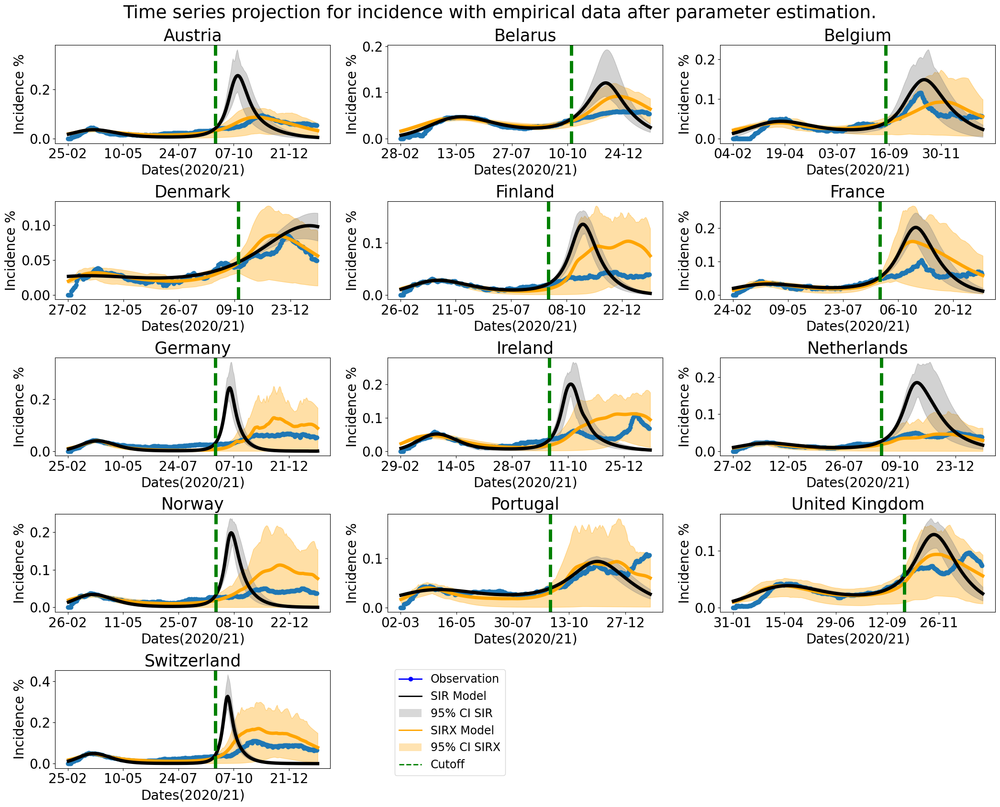

In [251]:
path1 = os.getcwd() + "/Paper Particles" #directory for posterior distribution
Country_path_old = os.getcwd() + '/Countries' #directory for empirical data

parameterErr = ['austriaAvg.csv', 'belarusAvg.csv', 'belgiumAvg.csv', 
 'denmarkAvg.csv', 'finlandAvg.csv', 'franceAvg.csv', 
 'germanyAvg.csv', 'irelandAvg.csv', 'netherlandsAvg.csv', 
 'norwayAvg.csv', 'portugalAvg.csv', 'ukAvg.csv', 'switzerlandAvg.csv']



K = 12 # number of parameters for SIRX
k_sir = 7 # number of parameters for SIR
n = 0.35

nrows = 5
ncols = 3
t_end = 200


num_countries = len(parameterErr)
Peak_SIR, Peak_SIRX = [], []
AREA_SIR, AREA_SIRX = [], []
Max_SIR, Max_SIRX = [], []
AICC_Sir, AICC_Sirp = [], []
AICC_Sirx, AICC_Sirxp = [], []
AICC_Sirx_eta, AICC_Sirxp_eta = [], []
Cutoff_Peak = []
Pred_Peak = []
SIR_LOg, SIRX_LOG = [], []
SIR_R2, SIRX_R2 = [], []
MAE_SIR, MAE_SIRX = [], []
RMSE_SIR, RMSE_SIRX = [], []
j = 0
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(21, 17))
axes = axes.flatten()
plt.suptitle(f"Time series projection for incidence with empirical data after parameter estimation.", y = 0.9900,  fontsize = 27)

for name in parameterErr:
    start_time = time.time()
    data_country = pd.read_csv(Country_path_old + "/" + name[:-4] + "7ma.csv")
    Cutoff = cutoff[name]
    peak_max = Peaks_prediction[name]

    data = data_country[data_country.columns[-1]][:]
    N = len(data)
    Cutoff_peak_value = max(data[:Cutoff-100])
    
    for f in range(Cutoff-100):
        if data[f] ==  Cutoff_peak_value:
            Cutoff_Peak.append((Cutoff_peak_value, f))
    
    W = N-30
    Pred_peak_value = max(data[Cutoff:W])
    
    for p in range(Cutoff,W):
        if data[p] ==  Pred_peak_value:
            Pred_Peak.append((Pred_peak_value, p))
    dataosi = pd.read_csv(Country_path_old + "/" + name[:-4] + "osi7ma.csv") 
    dataosi = dataosi[dataosi.columns[-1]][:N] 
    

    country_covid_old = pd.read_csv(Country_path_old + "/" + name[:-4] + "_updated.csv")
    country_covid_old['date'] = pd.to_datetime(country_covid_old["date"])
    date = country_covid_old['date'].dt.strftime('%d-%m')
    date = date[:].tolist()
    
    N_predict = N - Cutoff
    data_avg = np.mean(data)*(np.ones(N))
    data_avg_cutoff = np.mean(data[:Cutoff])*(np.ones(Cutoff))
    data_avg_predict = np.mean(data[Cutoff:])*(np.ones(N_predict))

    data_avgosi = np.mean(dataosi)*(np.ones(N))
    data_avgosi_cutoff = np.mean(dataosi[:Cutoff])*(np.ones(Cutoff))
    data_avgosi_predict = np.mean(dataosi[Cutoff:])*(np.ones(N_predict))
    Particle_Sir_eta = Particle_sir(path1 + '/' + name[:-4] + "_sir_latest.csv",0,200,Cutoff)  

    directory = os.path.join(path1, name[:-7] + "_final_par.csv")  
    
    Particle_Sirx_eta = Pop_negative(directory , 0, 200, Cutoff) 

    t = np.arange(0, N+1)

    SIRI_Peaks, SIRI_Peaks_Day = [], []
    SIRXI_Peaks, SIRXI_Peaks_Day  = [], []
    simulation_sir = []
    simulation_sirx, Behav = [], []
    simulation_sirx_eta, Behav_eta = [], []
    mse_sim, mse_X, mse_combined = [], [], []

    ax = axes[j]
    for i in range(100):
        try:
            I = ode(Particle_Sir_eta[i][1], N) 
            sirI_peak = I[Cutoff:].max()
            sirI_peak_time = [i for i in range(Cutoff,N) if I[i] == sirI_peak ][0]
            SIRI_Peaks.append(sirI_peak)
            SIRI_Peaks_Day.append(sirI_peak_time)
            simulation_sir.append(I)

            X_eta,Ix_eta = odex(Particle_Sirx_eta[i][1], N)
            # I = ode(Particle_Sir_eta[i][1], N) 
 
            if len(Ix_eta) < N+1:
                    continue
            if Ix_eta.size > 0:
                result = Ix_eta.take(0)  # Example of a take operation
            else:
                print("The array is empty.")

            sirxI_peak = Ix_eta[Cutoff:].max()
            sirxI_peak_time = [i for i in range(Cutoff,N) if Ix_eta[i] == sirxI_peak ][0]
            SIRXI_Peaks.append(sirxI_peak)
            SIRXI_Peaks_Day.append(sirxI_peak_time)
            simulation_sirx_eta.append(Ix_eta), Behav_eta.append(X_eta)
        except (ValueError,IndexError):
            pass
        continue
    simulation_I_avg_sir = np.mean(np.array(simulation_sir), axis = 0)

    residuals_sir = data[:] - simulation_I_avg_sir[1:]
    sim_low_sir, sim_high_sir = Percentile(simulation_sir, 2.5, 97.5)
    peak_low, peak_high = Percentile(SIRI_Peaks, 2.5, 97.5)
    peak_lowt, peak_hight = Percentile(SIRI_Peaks_Day, 2.5, 97.5)
    data_max_sir = simulation_I_avg_sir[Cutoff:].max()
    Max_SIR.append((data_max_sir,peak_low, peak_high))

    peak_max_sir = [i for i in arange(Cutoff,N) if simulation_I_avg_sir[i] == data_max_sir ][0]
    Peak_SIR.append((peak_max_sir,peak_lowt, peak_hight))

    simulation_I_avg_eta = np.mean(np.array(simulation_sirx_eta), axis = 0)
    simulation_X_avg_eta = np.mean(np.array(Behav_eta), axis = 0)
    sim_low_eta, sim_high_eta = Percentile(simulation_sirx_eta, 2.5, 97.5)
    sim_lowx_eta, sim_highx_eta = Percentile(Behav_eta, 2.5, 97.5)
    sirx_peak_low, sirx_peak_high = Percentile(SIRXI_Peaks, 2.5, 97.5)
    sirx_peak_lowt, sirx_peak_hight = Percentile(SIRXI_Peaks_Day, 2.5, 97.5)

    data_max_sirx = simulation_I_avg_eta[Cutoff:].max()
    Max_SIRX.append((data_max_sirx,sirx_peak_low, sirx_peak_high))
    peak_max_sirx = [i for i in arange(Cutoff,N) if simulation_I_avg_eta[i] == data_max_sirx ][0]
    Peak_SIRX.append((peak_max_sirx, sirx_peak_lowt, sirx_peak_hight))

    residuals_sirx = data[:] - simulation_I_avg_eta[:N]

    model_sir = simulation_I_avg_sir[:Cutoff]
    Rss_sir  = RSS(data[:Cutoff], model_sir)
    Aic_sir  = AIC(Rss_sir , Cutoff, k_sir)
    AiCc_sir  = AICc(Rss_sir , Cutoff, k_sir)
    r_square_adj = R_square_adj(Rss_sir, Cutoff, k_sir, data[:Cutoff], data_avg[:Cutoff], model_sir)
    sir_neg_log = negative_log_likelihood(simulation_I_avg_sir[:Cutoff], data[:Cutoff])
    SIR_LOg.append(round(sir_neg_log,2))
    SIR_R2.append(round(r_square_adj,6))

    AICC_Sir.append(round(AiCc_sir,2))

    model_eta = simulation_I_avg_eta[1:Cutoff+1]
    modelx_eta = simulation_X_avg_eta[:Cutoff]


    Rss_eta = RSS(data[:Cutoff], model_eta)
    Aic_eta = AIC(Rss_eta, Cutoff, K)
    AiCc_eta = AICc(Rss_eta, Cutoff, K)
    r_square_adj_eta = R_square_adj(Rss_eta, Cutoff, K, data[:Cutoff], data_avg[:Cutoff], model_eta)
    sirx_neg_log = negative_log_likelihood(simulation_I_avg_eta[:Cutoff], data[:Cutoff])


    Rssx_eta = RSS(dataosi[:Cutoff], modelx_eta)
    Aicx_eta = AIC(Rssx_eta, Cutoff, K)
    AiCcx_eta = AICc(Rssx_eta, Cutoff, K)
    r_square_adjx = R_square_adj(Rssx_eta, Cutoff, K, dataosi[:Cutoff], data_avgosi[:Cutoff], modelx_eta)
    sirx_neg_log_X = negative_log_likelihood(simulation_X_avg_eta[:Cutoff], dataosi[:Cutoff])
    SIRX_LOG.append((round(sirx_neg_log,2),round(sirx_neg_log_X,2))), SIRX_R2.append((round(r_square_adj_eta,6), round(r_square_adjx,6)))


    Caicc_eta = AiCc_eta + AiCcx_eta
    AICC_Sirx_eta.append(round(Caicc_eta,2))
    AICC_Sirx.append(round(AiCc_eta,2))

    '''Prediction'''
    modelp_sir = simulation_I_avg_sir[Cutoff:N+Cutoff]

    Rssp_sir = RSS(data[Cutoff:], modelp_sir[:-1])
    Aicp_sir = AIC(Rssp_sir, N_predict, k_sir)
    AiCcp_sir = AICc(Rssp_sir, N_predict, k_sir)
    Area_SIR = area_between_curves(data[Cutoff:], modelp_sir[:-1])
    AREA_SIR.append(Area_SIR)
    AICC_Sirp.append(round(AiCcp_sir,2))
    MAE_SIR.append(MAE(data[Cutoff:], modelp_sir[:-1]))
    RMSE_SIR.append(RMSE(data[Cutoff:], modelp_sir[:-1]))

    modelp_eta = simulation_I_avg_eta[Cutoff:N]
    modelxp_eta = simulation_X_avg_eta[Cutoff:N]

    tt = abs(len(data[Cutoff:])- len(modelp_eta[:]))
    Rssp_eta = RSS(data[Cutoff:], modelp_eta[:])
    Aicp_eta = AIC(Rssp_eta, N_predict, K)
    AiCcp_eta = AICc(Rssp_eta, N_predict, K)
    Area_SIRX = area_between_curves(data[Cutoff:], modelp_eta[:])
    AREA_SIRX.append(Area_SIRX)
    MAE_SIRX.append(MAE(data[Cutoff:], modelp_eta[:]))
    RMSE_SIRX.append(RMSE(data[Cutoff:], modelp_eta[:]))

    Rssxp_eta = RSS(dataosi[Cutoff:N+1], modelxp_eta[:len(dataosi[Cutoff:])])
    Aicxp_eta = AIC(Rssxp_eta, N_predict, K)
    AiCcxp_eta = AICc(Rssxp_eta, N_predict, K)




    Caiccp_eta = AiCcp_eta + AiCcxp_eta
    AICC_Sirxp_eta.append(round(Caiccp_eta,2))
    AICC_Sirxp.append(round(AiCcp_eta,2))

    
    ax.plot(np.cbrt(data[:]),"o", label ="Observation")
    ax.plot(t[1:], np.cbrt(simulation_I_avg_eta[1:]), color = 'orange',linewidth = 5, label ="Average SIRX")
    ax.plot(t[1:], np.cbrt(simulation_I_avg_sir[1:]), color = 'k',linewidth = 5, label ="Average SIR")
    ax.fill_between(t[1:], np.cbrt(sim_low_eta[1:]), np.cbrt(sim_high_eta[1:]), alpha=0.35, color="orange", label="95% CI SIRX")
    ax.fill_between(t[1:], np.cbrt(sim_low_sir[1:]), np.cbrt(sim_high_sir[1:]), alpha=0.35, color="grey", label="95% CI SIR")
    ax.axvline(x = Cutoff, color = 'green', linestyle="--", linewidth = 5)

    ax.set_xticks(np.arange(0, N, 75), date[: N: 75], rotation=0, fontsize=20)
    ax.tick_params(axis = "y", labelsize=20)

    ax.set_ylabel("Incidence %", fontsize=20)
    ax.set_xlabel("Dates(2020/21)", fontsize=20)


    title = name[:-7].capitalize()
    if name[:-7] == "uk":
        title = "United Kingdom" 
    ax.set_title(title, fontsize = 25)
    end_time = time.time()

    #Compute the elapsed time
    elapsed_time = end_time - start_time
    # print(f"Execution time: {elapsed_time:.6f} seconds")
    j +=1
for n in range(num_countries, len(axes)):
    axes[n].axis('off')

from matplotlib.patches import Patch

delta_handles = [plt.Line2D([0], [0], color='blue', lw=2, marker='o'),              # Observation
    plt.Line2D([0], [0], color='black', lw=2),
    Patch(facecolor='grey', alpha=0.3, edgecolor='none'),
    plt.Line2D([0], [0], color='orange', lw=2),            # SIRX Model
    Patch(facecolor='orange', alpha=0.3, edgecolor='none'),# 95% CI shaded
    plt.Line2D([0], [0], color='green', lw=2, linestyle="--"), # Cutoff 
    ]
Da = ["Observation", "SIR Model",  "95% CI SIR", "SIRX Model",  "95% CI SIRX" , "Cutoff"]
fig.legend(delta_handles, Da , loc='lower center', bbox_to_anchor=(0.45, 0.035), fontsize=17, title_fontsize='x-large')
plt.tight_layout()

# plt.savefig("Incidence_Prediction.jpeg", dpi = 300)
# plt.savefig("Incidence_Fitting.png", dpi = 300)
plt.show()

In [263]:
def loglik_pointwise(y_obs, y_pred, sigma):
    # y_obs, y_pred: shape (n_times,)
    return -0.5 * (np.log(2 * np.pi * sigma**2) + ((y_obs - y_pred)**2) / sigma**2)


def Pop_negative_waic(particlename, m, n, t_end):
    particles = pd.read_csv(particlename)
    N = len(particles.index)
    trials = []
    Incorrect_parameters = []
    if n > N:
        return ("Please enter a number less than %s" %N)
    else:
        for i in range(m,n):
            DenmaParp = particles
            err = DenmaParp['Error_I'][i] #eta = eta_0
            particle = np.array([DenmaParp['beta'][i], DenmaParp['b'][i], DenmaParp['gamma'][i], DenmaParp['c'][i],
                                 DenmaParp['epsilon'][i], DenmaParp['eta_0'][i], DenmaParp['kappa'][i],
                                 DenmaParp['lambda'][i], DenmaParp['phi'][i],
                                 DenmaParp['I0'][i], DenmaParp['x0'][i], DenmaParp['C0'][i]])
            X, trial_data = odex(particle, t_end)
            negative_values = [neg_val for neg_val in trial_data if neg_val < 0]
            if len(negative_values) == 0 and len(trial_data) == t_end + 1:
                trials.append((err, particle))
            else:
                Incorrect_parameters.append(int(i-m))
        return trials, Incorrect_parameters

In [83]:
def weighted_waic(loglik, weights):
    """
    loglik: shape (S, n)
    weights: shape (S,)
    """
    S, n = loglik.shape

    lppd = 0.0
    p_waic = 0.0

    for i in range(n):
        ll_i = loglik[:, i]

        # stabilize
        m = np.max(ll_i)
        weighted_mean = np.sum(weights * np.exp(ll_i - m))
        lppd_i = np.log(weighted_mean) + m

        # weighted variance
        mean_ll = np.sum(weights * ll_i)
        var_ll = np.sum(weights * (ll_i - mean_ll)**2)

        lppd += lppd_i
        p_waic += var_ll

    waic = -2 * (lppd - p_waic)
    return waic, lppd, p_waic

In [80]:
path3 = os.getcwd() + "/WAIC"
directory = os.path.join(path3, "austriaAvg7ma_4_waic.csv")
SIRX_weights = pd.read_csv(directory)["Weights"]

print(np.array(SIRX_weights[:100]))

[0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001
 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001
 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001
 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001
 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001
 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001
 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001
 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001
 0.001 0.001 0.001 0.001]


In [294]:
import os
import shutil

Execution time: 6.316810 seconds
Execution time: 51.327369 seconds
Execution time: 6.884379 seconds
Execution time: 3.305422 seconds
Execution time: 3.501697 seconds
Execution time: 16.994000 seconds
Execution time: 4.278571 seconds
Execution time: 7.426806 seconds
Execution time: 5.588329 seconds
Execution time: 4.226031 seconds
Execution time: 5.116396 seconds
Execution time: 31.682261 seconds
Execution time: 6.358665 seconds


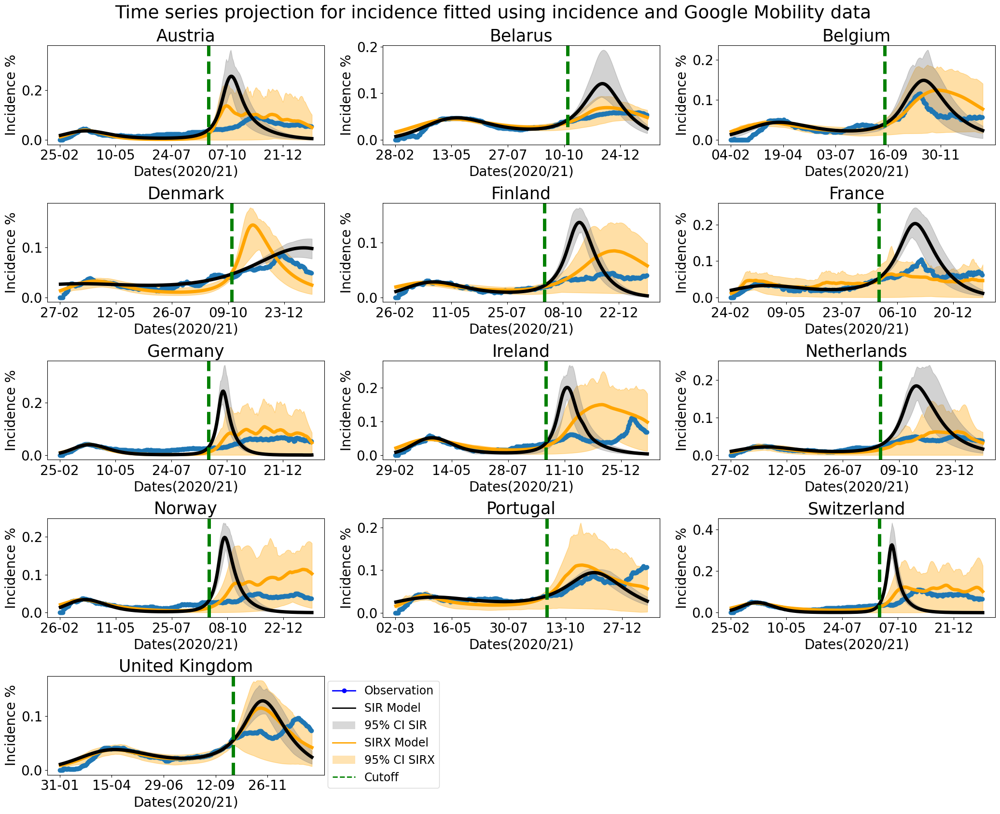

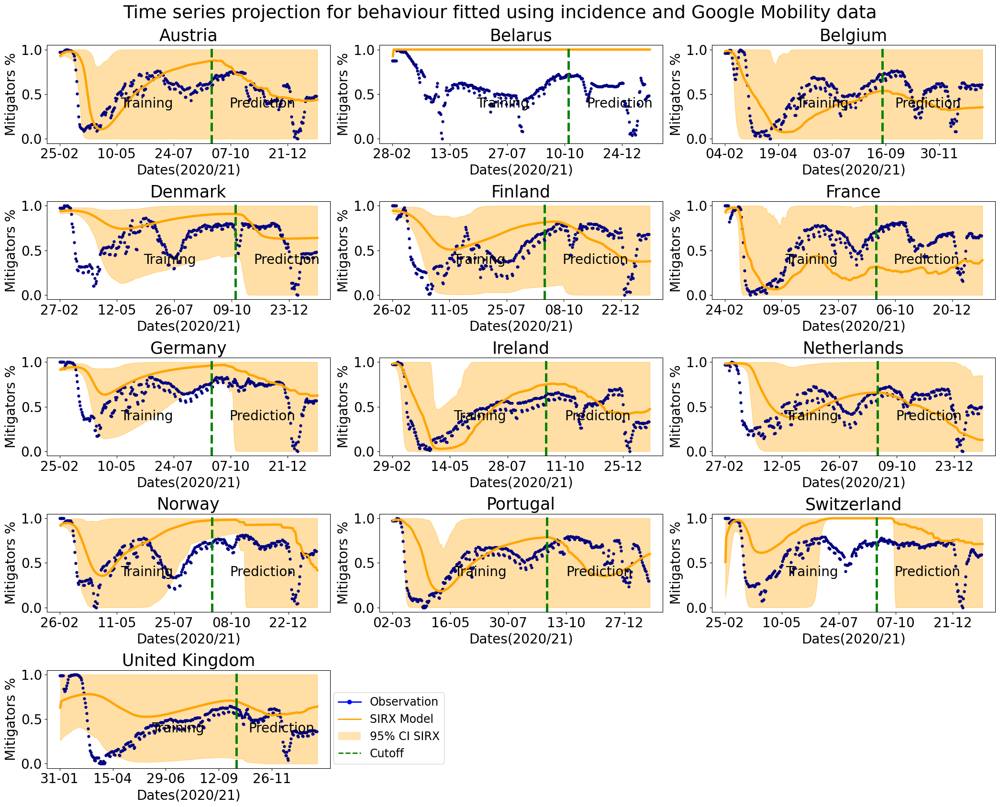

In [ ]:
path1 = os.getcwd() + "/Paper Particles" #directory for posterior distribution
# path2 = os.getcwd() + "/Google Results" #directory for posterior distribution
# path3 = os.getcwd() + "/WAIC" #directory for posterior distribution
path4 = os.getcwd() + "/Google Final" #directory for figures
Country_path_old = os.getcwd() + '/Countries' #directory for empirical data

parameterErr = ['austriaAvg.csv', 'belarusAvg.csv', 'belgiumAvg.csv', 
 'denmarkAvg.csv', 'finlandAvg.csv', 'franceAvg.csv', 
 'germanyAvg.csv', 'irelandAvg.csv', 'netherlandsAvg.csv', 
 'norwayAvg.csv', 'portugalAvg.csv', 'switzerlandAvg.csv', 'ukAvg.csv']

Index = {'austriaAvg.csv': (1, 19), 'belarusAvg.csv': (140, 18), 'belgiumAvg.csv': (2, 19), 
 'denmarkAvg.csv': (130, 19), 'finlandAvg.csv': (1, 16), 'franceAvg.csv': (2, 10), 
 'germanyAvg.csv': (140, 19), 'irelandAvg.csv': (1, 19), 'netherlandsAvg.csv': (3, 19), 
 'norwayAvg.csv': (1, 19), 'portugalAvg.csv': (1, 13), 'switzerlandAvg.csv': (7, 14), 'ukAvg.csv': (7, 16)} #'denmarkAvg.csv': (3, 19),

Index_waic = {'austriaAvg.csv': (2,4), 'belarusAvg.csv': (3,8), 'belgiumAvg.csv': (1,5), 
 'denmarkAvg.csv': (1,8), 'finlandAvg.csv': (1,6), 'franceAvg.csv': (2,6), 
 'germanyAvg.csv': (1,6), 'irelandAvg.csv': (2,5), 'netherlandsAvg.csv': (1,7), 
 'norwayAvg.csv': (1,7), 'portugalAvg.csv': (2,5), 'switzerlandAvg.csv': (2,7), 'ukAvg.csv': (1,7)}

K = 12 # number of parameters for SIRX
k_sir = 7 # number of parameters for SIR
n = 0.35

nrows = 5
ncols = 3
t_end = 200


num_countries = len(parameterErr)
Peak_SIR, Peak_SIRX = [], []
AREA_SIR, AREA_SIRX = [], []
Max_SIR, Max_SIRX = [], []
AICC_Sir, AICC_Sirp = [], []
AICC_Sirx, AICC_Sirxp = [], []
AICC_Sirx_eta, AICC_Sirxp_eta = [], []
Cutoff_Peak = []
Pred_Peak = []
SIR_LOg, SIRX_LOG = [], []
SIR_R2, SIRX_R2 = [], []
MAE_SIR, MAE_SIRX = [], []
RMSE_SIR, RMSE_SIRX = [], []
WAIC_Sirx, LPPD_Sirx, P_WAIC_Sirx = [], [], []
WAIC_Sir, LPPD_Sir, P_WAIC_Sir = [], [], []
j = 0
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(21, 17))
fig1, axes1 = plt.subplots(nrows=nrows, ncols=ncols, figsize=(21, 17))
axes = axes.flatten()
axes1 = axes1.flatten()
# fig, axes = plt.subplots( figsize=(15, 10))
# fig1, axes1 = plt.subplots( figsize=(15, 10))
fig.suptitle(f"Time series projection for incidence fitted using incidence and Google Mobility data ", y = 0.9900,  fontsize = 27)
fig1.suptitle(f"Time series projection for behaviour fitted using incidence and Google Mobility data", y = 0.9900,  fontsize = 27)

Set =[4] #np.arange(13) #[1,3,4,5,6,10,11,12]
# UU = 140
for i in Set[:]:
    name = parameterErr[i]
    start_time = time.time()
    data_country = pd.read_csv(Country_path_old + "/" + name[:-4] + "7ma.csv")
    Cutoff = cutoff[name]
    index = Index[name][0]
    ite = Index[name][1]
    index_waic_sir = Index_waic[name][0]
    index_waic_sirx = Index_waic[name][1]
    peak_max = Peaks_prediction[name]

    data = data_country[data_country.columns[-1]][:]
    N = len(data)
    Cutoff_peak_value = max(data[:Cutoff-100])
    
    for f in range(Cutoff-100):
        if data[f] ==  Cutoff_peak_value:
            Cutoff_Peak.append((Cutoff_peak_value, f))
    
    W = N-30
    Pred_peak_value = max(data[Cutoff:W])
    
    for p in range(Cutoff,W):
        if data[p] ==  Pred_peak_value:
            Pred_Peak.append((Pred_peak_value, p))
    # dataosi = pd.read_csv(Country_path_old + "/" + name[:-4] + "osi7ma.csv") 
    dataosi = pd.read_csv(Country_path_old + "/" +name[:-4] + "google_mobility.csv") 
    dataosi = dataosi[dataosi.columns[-1]][:N] 
    

    country_covid_old = pd.read_csv(Country_path_old + "/" + name[:-4] + "_updated.csv")
    country_covid_old['date'] = pd.to_datetime(country_covid_old["date"])
    date = country_covid_old['date'].dt.strftime('%d-%m')
    date = date[:].tolist()
    
    N_predict = N - Cutoff
    data_avg = np.mean(data)*(np.ones(N))
    data_avg_cutoff = np.mean(data[:Cutoff])*(np.ones(Cutoff))
    data_avg_predict = np.mean(data[Cutoff:])*(np.ones(N_predict))

    data_avgosi = np.mean(dataosi)*(np.ones(N))
    data_avgosi_cutoff = np.mean(dataosi[:Cutoff])*(np.ones(Cutoff))
    data_avgosi_predict = np.mean(dataosi[Cutoff:])*(np.ones(N_predict))
    Particle_Sir_eta = Particle_sir(path1 + '/' + name[:-4] + "_sir_latest.csv",0,200,Cutoff)  
    # Particle_Sir_eta = Particle_sir(path4 + '/' + name[:-4] + "_{ind}_sir_trial.csv".format(ind=index_waic_sir),20000,21000,Cutoff)  
    # SIR_weights = pd.read_csv(path4 + '/' + name[:-4] + "_{ind}_sir_trial.csv".format(ind=index_waic_sir))["Weights"] 


    # directory = os.path.join(path1, name[:-7] + "_final_par.csv")  
    directory = os.path.join(path4, name[:-4] + "7ma_{index}_gg_new.csv".format(index = 8)) #

    # SIRX_weights = pd.read_csv(directory)["Weights"] 
    # dataosi = pd.read_csv(name[:-4] + "google_mobility.csv") 
    
    # Particle_Sirx_eta = Pop_negative(directory , 19000, 20000, Cutoff) 
    # fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(21, 17))
    # fig1, axes1 = plt.subplots(nrows=nrows, ncols=ncols, figsize=(21, 17))
    # axes = axes.flatten()
    # axes1 = axes1.flatten()
    # j = 0
    # fig1.suptitle(f"Time series projection for incidence with empirical data after parameter estimation.", y = 0.9900,  fontsize = 27)
    # fig.suptitle(f"Time series projection for behaviour with empirical data after parameter estimation.", y = 0.9900,  fontsize = 27)
    # for ite in range(5,20):
    Particle_Sirx_eta = Pop_negative(directory , ite*1000, (ite+1)*1000, Cutoff)
        # print(len(Particle_Sirx_eta))

    # n = N - Cutoff
    # Particle_Sirx_eta, Incorrect_parameters = Pop_negative_waic(directory , 29000, 30000, Cutoff)
    # # print(Incorrect_parameters)
    # S = len(Particle_Sirx_eta[:100])
    # print(S)

    # loglik_sir = np.zeros((S, n))
    # loglik_sirx = np.zeros((S, n))

    # # for s, theta in enumerate(Particle_Sirx_eta):
    # #     # print(theta)
    # #     # y_sim = odex(theta, variant, t_end)
    # #     x, y_pred = odex(theta[1], t_end = n-1)

    # #     loglik[s, :] = loglik_pointwise(data[:Cutoff], y_pred, sigma=data[:Cutoff].std())


    # # print("Divergent:", Divergent)
    # weights_sirx = np.array(SIRX_weights)
    # weights_sirx = np.delete(weights_sirx, Incorrect_parameters)
    # weights_sirx = weights_sirx[:100] / np.sum(weights_sirx[:100])

    # weights_sir = np.array(SIR_weights)
    # # weights_sir = np.delete(weights_sir, Incorrect_parameters)
    # weights_sir = weights_sir[:100] / np.sum(weights_sir[:100])

    t = np.arange(0, N+1)

    SIRI_Peaks, SIRI_Peaks_Day = [], []
    SIRXI_Peaks, SIRXI_Peaks_Day  = [], []
    simulation_sir = []
    simulation_sirx, Behav = [], []
    simulation_sirx_eta, Behav_eta = [], []
    mse_sim, mse_X, mse_combined = [], [], []


    ax = axes[j]
    ax1 = axes1[j]
    for i in range(100):
        try:
            I = ode(Particle_Sir_eta[i][1], N) 
            # loglik_sir[i, :] = loglik_pointwise(data[Cutoff:], I[Cutoff:-1], sigma=data[Cutoff:].std())

            sirI_peak = I[Cutoff:].max()
            sirI_peak_time = [i for i in range(Cutoff,N) if I[i] == sirI_peak ][0]
            SIRI_Peaks.append(sirI_peak)
            SIRI_Peaks_Day.append(sirI_peak_time)
            simulation_sir.append(I)

            X_eta,Ix_eta = odex(Particle_Sirx_eta[i][1], N)
            # print(len(Ix_eta))
            # loglik_sirx[i, :] = loglik_pointwise(data[Cutoff:], Ix_eta[Cutoff:-1], sigma=data[Cutoff:].std())
            # I = ode(Particle_Sir_eta[i][1], N)

            if len(Ix_eta) < N+1:
                    continue
            if Ix_eta.size > 0:
                result = Ix_eta.take(0)  # Example of a take operation
            else:
                print("The array is empty.")

            sirxI_peak = Ix_eta[Cutoff:].max()
            sirxI_peak_time = [i for i in range(Cutoff,N) if Ix_eta[i] == sirxI_peak ][0]
            SIRXI_Peaks.append(sirxI_peak)
            SIRXI_Peaks_Day.append(sirxI_peak_time)
            simulation_sirx_eta.append(Ix_eta), Behav_eta.append(X_eta)
        except (ValueError,IndexError):
            pass
        continue
    simulation_I_avg_sir = np.mean(np.array(simulation_sir), axis = 0)

    residuals_sir = data[:] - simulation_I_avg_sir[1:]
    sim_low_sir, sim_high_sir = Percentile(simulation_sir, 2.5, 97.5)
    peak_low, peak_high = Percentile(SIRI_Peaks, 2.5, 97.5)
    peak_lowt, peak_hight = Percentile(SIRI_Peaks_Day, 2.5, 97.5)
    data_max_sir = simulation_I_avg_sir[Cutoff:].max()
    Max_SIR.append((data_max_sir,peak_low, peak_high))

    peak_max_sir = [i for i in arange(Cutoff,N) if simulation_I_avg_sir[i] == data_max_sir ][0]
    Peak_SIR.append((peak_max_sir,peak_lowt, peak_hight))

    simulation_I_avg_eta = np.mean(np.array(simulation_sirx_eta), axis = 0)
    simulation_X_avg_eta = np.mean(np.array(Behav_eta), axis = 0)
    sim_low_eta, sim_high_eta = Percentile(simulation_sirx_eta, 2.5, 97.5)
    sim_lowx_eta, sim_highx_eta = Percentile(Behav_eta, 2.5, 97.5)
    sirx_peak_low, sirx_peak_high = Percentile(SIRXI_Peaks, 2.5, 97.5)
    sirx_peak_lowt, sirx_peak_hight = Percentile(SIRXI_Peaks_Day, 2.5, 97.5)

    data_max_sirx = simulation_I_avg_eta[Cutoff:].max()
    Max_SIRX.append((data_max_sirx,sirx_peak_low, sirx_peak_high))
    peak_max_sirx = [i for i in arange(Cutoff,N) if simulation_I_avg_eta[i] == data_max_sirx ][0]
    Peak_SIRX.append((peak_max_sirx, sirx_peak_lowt, sirx_peak_hight))

    residuals_sirx = data[:] - simulation_I_avg_eta[:N]

    model_sir = simulation_I_avg_sir[:Cutoff]
    Rss_sir  = RSS(data[:Cutoff], model_sir)
    Aic_sir  = AIC(Rss_sir , Cutoff, k_sir)
    AiCc_sir  = AICc(Rss_sir , Cutoff, k_sir)
    r_square_adj = R_square_adj(Rss_sir, Cutoff, k_sir, data[:Cutoff], data_avg[:Cutoff], model_sir)
    sir_neg_log = negative_log_likelihood(simulation_I_avg_sir[:Cutoff], data[:Cutoff])
    SIR_LOg.append(round(sir_neg_log,2))
    SIR_R2.append(round(r_square_adj,6))

    AICC_Sir.append(round(AiCc_sir,2))

    model_eta = simulation_I_avg_eta[1:Cutoff+1]
    modelx_eta = simulation_X_avg_eta[:Cutoff]


    Rss_eta = RSS(data[:Cutoff], model_eta)
    Aic_eta = AIC(Rss_eta, Cutoff, K)
    AiCc_eta = AICc(Rss_eta, Cutoff, K)
    r_square_adj_eta = R_square_adj(Rss_eta, Cutoff, K, data[:Cutoff], data_avg[:Cutoff], model_eta)
    sirx_neg_log = negative_log_likelihood(simulation_I_avg_eta[:Cutoff], data[:Cutoff])


    Rssx_eta = RSS(dataosi[:Cutoff], modelx_eta)
    Aicx_eta = AIC(Rssx_eta, Cutoff, K)
    AiCcx_eta = AICc(Rssx_eta, Cutoff, K)
    r_square_adjx = R_square_adj(Rssx_eta, Cutoff, K, dataosi[:Cutoff], data_avgosi[:Cutoff], modelx_eta)
    sirx_neg_log_X = negative_log_likelihood(simulation_X_avg_eta[:Cutoff], dataosi[:Cutoff])
    SIRX_LOG.append((round(sirx_neg_log,2),round(sirx_neg_log_X,2))), SIRX_R2.append((round(r_square_adj_eta,6), round(r_square_adjx,6)))


    Caicc_eta = AiCc_eta + AiCcx_eta
    AICC_Sirx_eta.append(round(Caicc_eta,2))
    AICC_Sirx.append(round(AiCc_eta,2))

    '''Prediction'''
    modelp_sir = simulation_I_avg_sir[Cutoff:N+Cutoff]

    Rssp_sir = RSS(data[Cutoff:], modelp_sir[:-1])
    Aicp_sir = AIC(Rssp_sir, N_predict, k_sir)
    AiCcp_sir = AICc(Rssp_sir, N_predict, k_sir)
    Area_SIR = area_between_curves(data[Cutoff:], modelp_sir[:-1])
    AREA_SIR.append(Area_SIR)
    AICC_Sirp.append(round(AiCcp_sir,2))
    MAE_SIR.append(MAE(data[Cutoff:], modelp_sir[:-1]))
    RMSE_SIR.append(RMSE(data[Cutoff:], modelp_sir[:-1]))

    modelp_eta = simulation_I_avg_eta[Cutoff:N]
    modelxp_eta = simulation_X_avg_eta[Cutoff:N]

    tt = abs(len(data[Cutoff:])- len(modelp_eta[:]))
    Rssp_eta = RSS(data[Cutoff:], modelp_eta[:])
    Aicp_eta = AIC(Rssp_eta, N_predict, K)
    AiCcp_eta = AICc(Rssp_eta, N_predict, K)
    Area_SIRX = area_between_curves(data[Cutoff:], modelp_eta[:])
    AREA_SIRX.append(Area_SIRX)
    MAE_SIRX.append(MAE(data[Cutoff:], modelp_eta[:]))
    RMSE_SIRX.append(RMSE(data[Cutoff:], modelp_eta[:]))

    Rssxp_eta = RSS(dataosi[Cutoff:N+1], modelxp_eta[:len(dataosi[Cutoff:])])
    Aicxp_eta = AIC(Rssxp_eta, N_predict, K)
    AiCcxp_eta = AICc(Rssxp_eta, N_predict, K)


    # waic_sir, lppd_sir, p_waic_sir = weighted_waic(loglik_sir, weights_sir)
    # WAIC_Sir.append(waic_sir), LPPD_Sir.append(lppd_sir), P_WAIC_Sir.append(p_waic_sir)
    # waic_sirx, lppd_sirx, p_waic_sirx = weighted_waic(loglik_sirx, weights_sirx)
    # WAIC_Sirx.append(waic_sirx), LPPD_Sirx.append(lppd_sirx), P_WAIC_Sirx.append(p_waic_sirx)
    # print("Country", name)
    # print("Calculating WAIC for SIR...")
    # print("WAIC:", waic_sir, "LPPD:", lppd_sir, "P_WAIC:", p_waic_sir)

    # print("Calculating WAIC for SIRX...")
    # print("WAIC:", waic_sirx, "LPPD:", lppd_sirx, "P_WAIC:", p_waic_sirx)

    Caiccp_eta = AiCcp_eta + AiCcxp_eta
    AICC_Sirxp_eta.append(round(Caiccp_eta,2))
    AICC_Sirxp.append(round(AiCcp_eta,2))

    ax1.plot(dataosi[:],"o", color = 'navy', markersize = 3.5 )
    ax1.plot(t[1:], simulation_X_avg_eta[:-1], color = 'orange',linewidth = 3.5)
    ax1.fill_between(t[1:], sim_lowx_eta[:-1], sim_highx_eta[:-1], alpha=0.35, color="orange")

    ax1.set_ylabel("Mitigators %", fontsize=20)
    ax1.set_xlabel("Dates(2020/21)", fontsize=20)
    ax1.axvline(x = Cutoff, color = 'green', linewidth = 3.5, linestyle = "--")
    ax1.text(Cutoff - 120 ,0.35 ,"Training", ha = 'left', fontsize = 20)
    ax1.text(Cutoff + 110 ,0.35 ,"Prediction", ha = 'right', fontsize = 20)
    ax1.set_xticks(np.arange( 0, N, 75), date[0: N: 75], rotation=0, fontsize=20)
    ax1.tick_params(axis = "y", labelsize = 20)

    title = name[:-7].capitalize()
    if name[:-7] == "uk":
        title = "United Kingdom" 
    ax1.set_title(title, fontsize = 25)
    end_time = time.time()

    # Compute the elapsed time
    elapsed_time = end_time - start_time
    print(f"Execution time: {elapsed_time:.6f} seconds")
    # j +=1
    
    ax.plot(np.cbrt(data[:]),"o", label ="Observation")
    ax.plot(t[1:], np.cbrt(simulation_I_avg_eta[1:]), color = 'orange',linewidth = 5, label ="Average SIRX")
    ax.plot(t[1:], np.cbrt(simulation_I_avg_sir[1:]), color = 'k',linewidth = 5, label ="Average SIR")
    ax.fill_between(t[1:], np.cbrt(sim_low_eta[1:]), np.cbrt(sim_high_eta[1:]), alpha=0.35, color="orange", label="95% CI SIRX")
    ax.fill_between(t[1:], np.cbrt(sim_low_sir[1:]), np.cbrt(sim_high_sir[1:]), alpha=0.35, color="grey", label="95% CI SIR")
    ax.axvline(x = Cutoff, color = 'green', linestyle="--", linewidth = 5)

    ax.set_xticks(np.arange(0, N, 75), date[: N: 75], rotation=0, fontsize=20)
    ax.tick_params(axis = "y", labelsize=20)

    ax.set_ylabel("Incidence %", fontsize=20)
    ax.set_xlabel("Dates(2020/21)", fontsize=20)


    title = name[:-7].capitalize()
    if name[:-7] == "uk":
        title = "United Kingdom" 
    ax.set_title(title, fontsize = 25)
    end_time = time.time()

    #Compute the elapsed time
    elapsed_time = end_time - start_time
    # print(f"Execution time: {elapsed_time:.6f} seconds")
    j +=1
for n in range(num_countries, len(axes)):
    axes[n].axis('off')
    axes1[n].axis('off')
# for n in range(num_countries, len(axes)):
#     axes[n].axis('off') 

from matplotlib.patches import Patch

delta_handles = [plt.Line2D([0], [0], color='blue', lw=2, marker='o'),              # Observation
    plt.Line2D([0], [0], color='black', lw=2),
    Patch(facecolor='grey', alpha=0.3, edgecolor='none'),
    plt.Line2D([0], [0], color='orange', lw=2),            # SIRX Model
    Patch(facecolor='orange', alpha=0.3, edgecolor='none'),# 95% CI shaded
    plt.Line2D([0], [0], color='green', lw=2, linestyle="--"), # Cutoff 
    ]

delta_handles1 = [plt.Line2D([0], [0], color='blue', lw=2, marker='o'),              # Observation
    # plt.Line2D([0], [0], color='black', lw=2),
    # Patch(facecolor='grey', alpha=0.3, edgecolor='none'),
    plt.Line2D([0], [0], color='orange', lw=2),            # SIRX Model
    Patch(facecolor='orange', alpha=0.3, edgecolor='none'),# 95% CI shaded
    plt.Line2D([0], [0], color='green', lw=2, linestyle="--"), # Cutoff 
    ]
Da = ["Observation", "SIR Model",  "95% CI SIR", "SIRX Model",  "95% CI SIRX" , "Cutoff"]
Da1 = ["Observation", "SIRX Model",  "95% CI SIRX" , "Cutoff"]
fig.legend(delta_handles, Da , loc='right', bbox_to_anchor=(0.45, 0.1), fontsize=17, title_fontsize='x-large')
fig1.legend(delta_handles1, Da1 , loc='right', bbox_to_anchor=(0.45, 0.1), fontsize=17, title_fontsize='x-large')
fig.tight_layout()
fig1.tight_layout()

# fig.savefig("Incidence_Google_I1.jpeg", dpi = 300)
# fig1.savefig("Incidence_Google_X1.jpeg", dpi = 300)
# fig.savefig("Incidence_WAIC.jpeg", dpi = 300)
plt.show()

In [305]:
avg_sir = np.mean(AREA_SIR)
std_air = np.std(AREA_SIR)
avg_sirx = np.mean(AREA_SIRX)
std_airx = np.std(AREA_SIRX)


print(avg_sir, std_air, avg_sirx, std_airx)

avg_aics = np.mean(AICC_Sirp)
std_aics = np.std(AICC_Sirp)
avg_aicx = np.mean(AICC_Sirxp)
std_aicx = np.std(AICC_Sirxp)

print(avg_aics, std_aics, avg_aicx, std_aicx)

0.1597064669398675 0.114791928564105 0.06964392865419497 0.04849489819108554
-2294.8561538461536 211.70790260089163 -2602.9930769230773 325.72546917220893


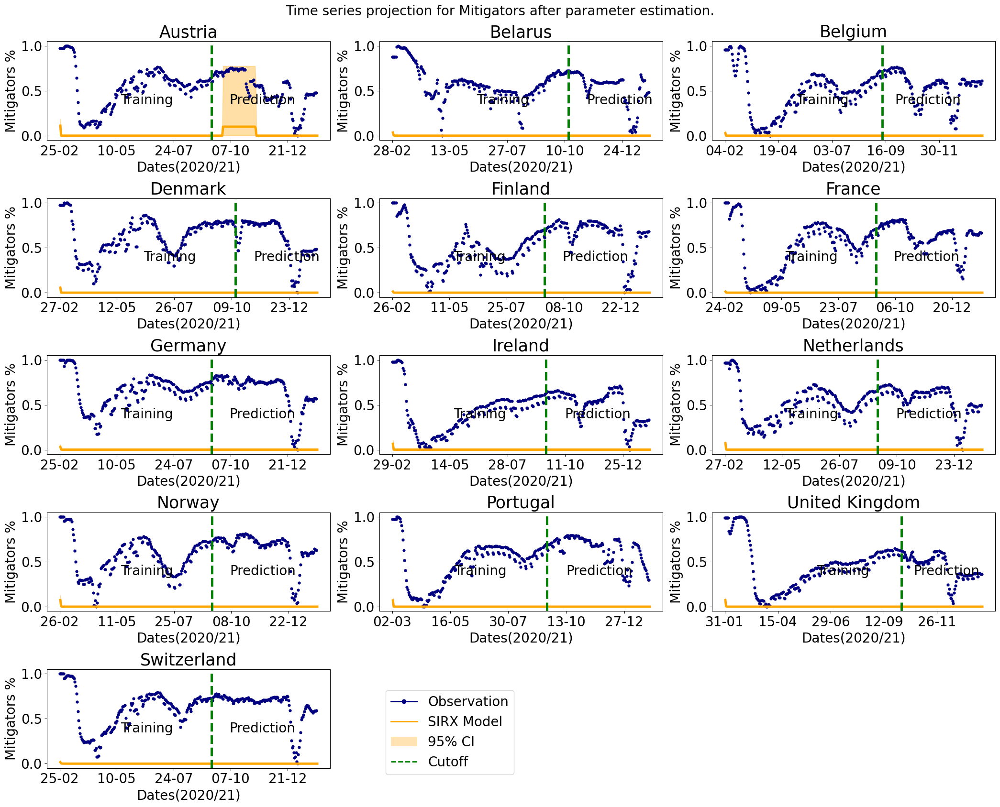

In [79]:
Peak_SIR, Peak_SIRX = [], []
AREA_SIR, AREA_SIRX = [], []
Max_SIR, Max_SIRX = [], []
AICC_Sir, AICC_Sirp = [], []
AICC_Sirx, AICC_Sirxp = [], []
AICC_Sirx_eta, AICC_Sirxp_eta = [], []
Cutoff_Peak = []
Pred_Peak = []
SIR_LOg, SIRX_LOG = [], []
SIR_R2, SIRX_R2 = [], []
j = 0
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(21, 17))
axes = axes.flatten()
plt.suptitle(f"Time series projection for Mitigators after parameter estimation.", y = 0.99,  fontsize = 20)


for name in parameterErr:
    start_time = time.time()
    data_country = pd.read_csv(Country_path_old + "/" + name[:-4] + "7ma.csv")
    Cutoff = cutoff[name]
    peak_max = Peaks_prediction[name]

    data = data_country[data_country.columns[-1]][:]
    N = len(data)
    Cutoff_peak_value = max(data[:Cutoff-100])
    
    for f in range(Cutoff-100):
        if data[f] ==  Cutoff_peak_value:
            Cutoff_Peak.append((Cutoff_peak_value, f))
    
    W = N-30
    Pred_peak_value = max(data[Cutoff:W])
    
    for p in range(Cutoff,W):
        if data[p] ==  Pred_peak_value:
            Pred_Peak.append((Pred_peak_value, p))
    # dataosi = pd.read_csv(Country_path_old + "/" + name[:-4] + "osi7ma.csv") 
    dataosi = pd.read_csv(name[:-4] + "google_mobility.csv")
    dataosi = dataosi[dataosi.columns[-1]][:N] 

    country_covid_old = pd.read_csv(Country_path_old + "/" + name[:-4] + "_updated.csv")
    country_covid_old['date'] = pd.to_datetime(country_covid_old["date"])
    date = country_covid_old['date'].dt.strftime('%d-%m')
    date = date[:].tolist()

    N_predict = N - Cutoff
    data_avg = np.mean(data)*(np.ones(N))
    data_avg_cutoff = np.mean(data[:Cutoff])*(np.ones(Cutoff))
    data_avg_predict = np.mean(data[Cutoff:])*(np.ones(N_predict))

    data_avgosi = np.mean(dataosi)*(np.ones(N))
    data_avgosi_cutoff = np.mean(dataosi[:Cutoff])*(np.ones(Cutoff))
    data_avgosi_predict = np.mean(dataosi[Cutoff:])*(np.ones(N_predict))
    
    Particle_Sir_eta = Particle_sir(path1 + '/' + name[:-4] + "_sir_latest.csv",0,300,Cutoff)  

    # directory = os.path.join(path1, name[:-7] + "_final_par.csv") 
    directory = os.path.join(path2, name[:-4] + "7ma_2_gg.csv")  
 
    Particle_Sirx_eta = Pop_negative(directory , 9000, 10000, Cutoff) 

    t = np.arange(0, N+1)
    SIRI_Peaks, SIRI_Peaks_Day = [], []
    SIRXI_Peaks, SIRXI_Peaks_Day  = [], []
    simulation_sir = []
    simulation_sirx, Behav = [], []
    simulation_sirx_eta, Behav_eta = [], []
    mse_sim, mse_X, mse_combined = [], [], []

    ax = axes[j]
    for i in range(10):
        try:
            I = ode(Particle_Sir_eta[i][1], N) 
            sirI_peak = I[Cutoff:-5].max() #Extracts the maximum value
            sirI_peak_time = [i for i in range(Cutoff, N-5) if I[i] == sirI_peak ][0] #match maximum value to index (time)
            SIRI_Peaks.append(sirI_peak)
            SIRI_Peaks_Day.append(sirI_peak_time)
            simulation_sir.append(I)

            X_eta,Ix_eta = odex(Particle_Sirx_eta[i][1], N)
            
            if len(Ix_eta) < N+1:
                    continue
            if Ix_eta.size > 0:
                result = Ix_eta.take(0)  
            else:
                print("The array is empty.")

            sirxI_peak = Ix_eta[Cutoff:N].max()
            sirxI_peak_time = [i for i in range(Cutoff,N) if Ix_eta[i] == sirxI_peak ][0]
            SIRXI_Peaks.append(sirxI_peak)
            SIRXI_Peaks_Day.append(sirxI_peak_time)
            simulation_sirx_eta.append(Ix_eta), Behav_eta.append(X_eta)
        except (ValueError,IndexError):
#             print(i)
            pass
        continue
    simulation_I_avg_sir = np.mean(np.array(simulation_sir), axis = 0)

    residuals_sir = data[:] - simulation_I_avg_sir[1:]
    sim_low_sir, sim_high_sir = Percentile(simulation_sir, 2.5, 97.5)
    peak_low, peak_high = Percentile(SIRI_Peaks, 2.5, 97.5)
    peak_lowt, peak_hight = Percentile(SIRI_Peaks_Day, 2.5, 97.5)
    data_max_sir = simulation_I_avg_sir[Cutoff:-5].max() #extract the max in the average
    Max_SIR.append((data_max_sir,peak_low, peak_high))

    peak_max_sir = [i for i in arange(len(simulation_I_avg_sir)) if simulation_I_avg_sir[i] == data_max_sir ][0]
    Peak_SIR.append((peak_max_sir,peak_lowt, peak_hight))

    simulation_I_avg_eta = np.mean(np.array(simulation_sirx_eta), axis = 0)
#     print(simulation_I_avg)
    simulation_X_avg_eta = np.mean(np.array(Behav_eta), axis = 0)
    sim_low_eta, sim_high_eta = Percentile(simulation_sirx_eta, 2.5, 97.5)
    sim_lowx_eta, sim_highx_eta = Percentile(Behav_eta, 2.5, 97.5)
    sirx_peak_low, sirx_peak_high = Percentile(SIRXI_Peaks, 2.5, 97.5)
    sirx_peak_lowt, sirx_peak_hight = Percentile(SIRXI_Peaks_Day, 2.5, 97.5)

    data_max_sirx = simulation_I_avg_eta[Cutoff:].max()
    Max_SIRX.append((data_max_sirx,sirx_peak_low, sirx_peak_high))
    peak_max_sirx = [i for i in arange(len(simulation_I_avg_eta)) if simulation_I_avg_eta[i] == data_max_sirx ][0]
    Peak_SIRX.append((peak_max_sirx, sirx_peak_lowt, sirx_peak_hight))

    residuals_sirx = data[:] - simulation_I_avg_eta[:N]

    model_sir = simulation_I_avg_sir[:Cutoff]
    Rss_sir  = RSS(data[:Cutoff], model_sir)
    Aic_sir  = AIC(Rss_sir , Cutoff, k_sir)
    AiCc_sir  = AICc(Rss_sir , Cutoff, k_sir)
    r_square_adj = R_square_adj(Rss_sir, Cutoff, k_sir, data[:Cutoff], data_avg[:Cutoff], model_sir)
    sir_neg_log = negative_log_likelihood(simulation_I_avg_sir[:Cutoff], data[:Cutoff])
    SIR_LOg.append(round(sir_neg_log,2))
    SIR_R2.append(round(r_square_adj,6))

    AICC_Sir.append(round(AiCc_sir,2))


    model_eta = simulation_I_avg_eta[1:Cutoff+1]
    modelx_eta = simulation_X_avg_eta[:Cutoff]


    Rss_eta = RSS(data[:Cutoff], model_eta)
    Aic_eta = AIC(Rss_eta, Cutoff, K)
    AiCc_eta = AICc(Rss_eta, Cutoff, K)
    r_square_adj_eta = R_square_adj(Rss_eta, Cutoff, K, data[:Cutoff], data_avg[:Cutoff], model_eta)
    sirx_neg_log = negative_log_likelihood(simulation_I_avg_eta[:Cutoff], data[:Cutoff])
    

    Rssx_eta = RSS(dataosi[:Cutoff], modelx_eta)
    Aicx_eta = AIC(Rssx_eta, Cutoff, K)
    AiCcx_eta = AICc(Rssx_eta, Cutoff, K)
    r_square_adjx = R_square_adj(Rssx_eta, Cutoff, K, dataosi[:Cutoff], data_avgosi[:Cutoff], modelx_eta)
    sirx_neg_log_X = negative_log_likelihood(simulation_X_avg_eta[:Cutoff], dataosi[:Cutoff])
    SIRX_LOG.append((round(sirx_neg_log,2),round(sirx_neg_log_X,2))), SIRX_R2.append((round(r_square_adj_eta,6), round(r_square_adjx,6)))


    Caicc_eta = AiCc_eta + AiCcx_eta
    AICC_Sirx_eta.append(round(Caicc_eta,2))
    AICC_Sirx.append(round(AiCc_eta,2))

    '''Prediction'''
    modelp_sir = simulation_I_avg_sir[Cutoff:N+Cutoff]

    Rssp_sir = RSS(data[Cutoff:], modelp_sir[:-1])
    Aicp_sir = AIC(Rssp_sir, N_predict, k_sir)
    AiCcp_sir = AICc(Rssp_sir, N_predict, k_sir)
    Area_SIR = area_between_curves(data[Cutoff:], modelp_sir[:-1])
    AREA_SIR.append(Area_SIR)
    AICC_Sirp.append(round(AiCcp_sir,2))


    modelp_eta = simulation_I_avg_eta[Cutoff:N]
    modelxp_eta = simulation_X_avg_eta[Cutoff:N]

    tt = abs(len(data[Cutoff:])- len(modelp_eta[:]))
    Rssp_eta = RSS(data[Cutoff:], modelp_eta[:])
    Aicp_eta = AIC(Rssp_eta, N_predict, K)
    AiCcp_eta = AICc(Rssp_eta, N_predict, K)
    Area_SIRX = area_between_curves(data[Cutoff:], modelp_eta[:])
    AREA_SIRX.append(Area_SIRX)


    Rssxp_eta = RSS(dataosi[Cutoff:N+1], modelxp_eta[:len(dataosi[Cutoff:])])
    Aicxp_eta = AIC(Rssxp_eta, N_predict, K)
    AiCcxp_eta = AICc(Rssxp_eta, N_predict, K)


    Caiccp_eta = AiCcp_eta + AiCcxp_eta
    AICC_Sirxp_eta.append(round(Caiccp_eta,2))
    AICC_Sirxp.append(round(AiCcp_eta,2))




    '''Full/Complete'''
    ax.plot(dataosi[:],"o", color = 'navy', markersize = 3.5 )
    ax.plot(t[1:], simulation_X_avg_eta[:-1], color = 'orange',linewidth = 3.5)
    ax.fill_between(t[1:], sim_lowx_eta[:-1], sim_highx_eta[:-1], alpha=0.35, color="orange")

    ax.set_ylabel("Mitigators %", fontsize=20)
    ax.set_xlabel("Dates(2020/21)", fontsize=20)
    ax.axvline(x = Cutoff, color = 'green', linewidth = 3.5, linestyle = "--")
    ax.text(Cutoff - 120 ,0.35 ,"Training", ha = 'left', fontsize = 20)
    ax.text(Cutoff + 110 ,0.35 ,"Prediction", ha = 'right', fontsize = 20)
    ax.set_xticks(np.arange( 0, N, 75), date[0: N: 75], rotation=0, fontsize=20)
    ax.tick_params(axis = "y", labelsize = 20)
    
    title = name[:-7].capitalize()
    if name[:-7] == "uk":
        title = "United Kingdom" 
    ax.set_title(title, fontsize = 25)
    end_time = time.time()

    #Compute the elapsed time
    elapsed_time = end_time - start_time
    # print(f"Execution time: {elapsed_time:.6f} seconds")
    j +=1
for n in range(num_countries, len(axes)):
    axes[n].axis('off')


delta_handles = [plt.Line2D([0], [0], color='navy', lw=2, marker='o'),              # Observation
    plt.Line2D([0], [0], color='orange', lw=2),            # SIRX Model
    Patch(facecolor='orange', alpha=0.3, edgecolor='none'),# 95% CI shaded
    plt.Line2D([0], [0], color='green', lw=2, linestyle="--") # Cutoff 
    ]
Da = ["Observation", "SIRX Model", "95% CI", "Cutoff"]
fig.legend(delta_handles, Da , loc='lower center', bbox_to_anchor=(0.45, 0.035), fontsize=20, title_fontsize='x-large')
plt.tight_layout()

# plt.savefig("Behaviour_Prediction.jpeg", dpi = 300)
plt.show()

In [291]:
SIR_LOg, SIRX_LOG
SIR_R2, SIRX_R2 
AICC_Sir
AICC_Sirx

Country =  ['Austria', 'Belarus', 'Belgium', 'Denmark', 'Finland', 'France', 
            'Germany', 'Ireland', 'Netherlands', 'Norway', 'Portugal', 'Switzerland', 'United \n Kingdom']
for j in range(len(Country)):
    # print(f"{Country[j]} & {Peaks_value[j]} ({Peaks_date[j]}) & {Peak_SIR[j][0]} $\in$ ({int(Peak_SIR[j][1])}, {int(Peak_SIR[j][2])}) & {int(Peak_SIRX[j][0])} $\in$ ({int(Peak_SIRX[j][1])}, {int(Peak_SIRX[j][2])})")
    print(f"{Country[j]} & SIRX Model Incidence & {SIRX_LOG[j][0]}  & {SIRX_R2[j][0]} & {AICC_Sirx[j]}")
    print(f"  & SIRX Model Behaviour & {SIRX_LOG[j][1]}  & {SIRX_R2[j][1]} & {round(AICC_Sirx_eta[j] - AICC_Sirx[j],2)}  ")
    print(f" & SIR Model & {SIR_LOg[j]}  & {SIR_R2[j]} & {AICC_Sir[j]} \\n" )



Austria & SIRX Model Incidence & 117.97  & 0.999923 & -5500.82
  & SIRX Model Behaviour & 113.7  & 0.994811 & -1613.22  
 & SIR Model & 98.07  & 0.999929 & -5522.45 \n
Belarus & SIRX Model Incidence & 114.77  & 0.99964 & -6365.67
  & SIRX Model Behaviour & 680.71  & 0.972868 & -1583.64  
 & SIR Model & 104.82  & 0.999939 & -6777.57 \n
Belgium & SIRX Model Incidence & 100.56  & 0.999791 & -5764.92
  & SIRX Model Behaviour & 129.63  & 0.996315 & -1807.43  
 & SIR Model & 100.18  & 0.999882 & -5896.74 \n
Denmark & SIRX Model Incidence & 141.37  & 0.999573 & -6108.09
  & SIRX Model Behaviour & 253.71  & 0.989422 & -1760.16  
 & SIR Model & 104.89  & 0.999855 & -6362.86 \n
Finland & SIRX Model Incidence & 89.08  & 0.999645 & -5963.0
  & SIRX Model Behaviour & 258.57  & 0.990943 & -1507.69  
 & SIR Model & 88.59  & 0.999926 & -6281.13 \n
France & SIRX Model Incidence & 192.64  & 0.999548 & -5132.84
  & SIRX Model Behaviour & 166.01  & 0.994914 & -1534.87  
 & SIR Model & 89.85  & 0.999953 & 

0.008305872984928351 0.009037102670699996
0.0015630383457078594 0.0010061850267770196
0.0006033177948717562 0.0004719671935852919
253.53846153846155 31.16856252605866
275.38461538461536 30.15992874287252
278.0 24.87816466146723


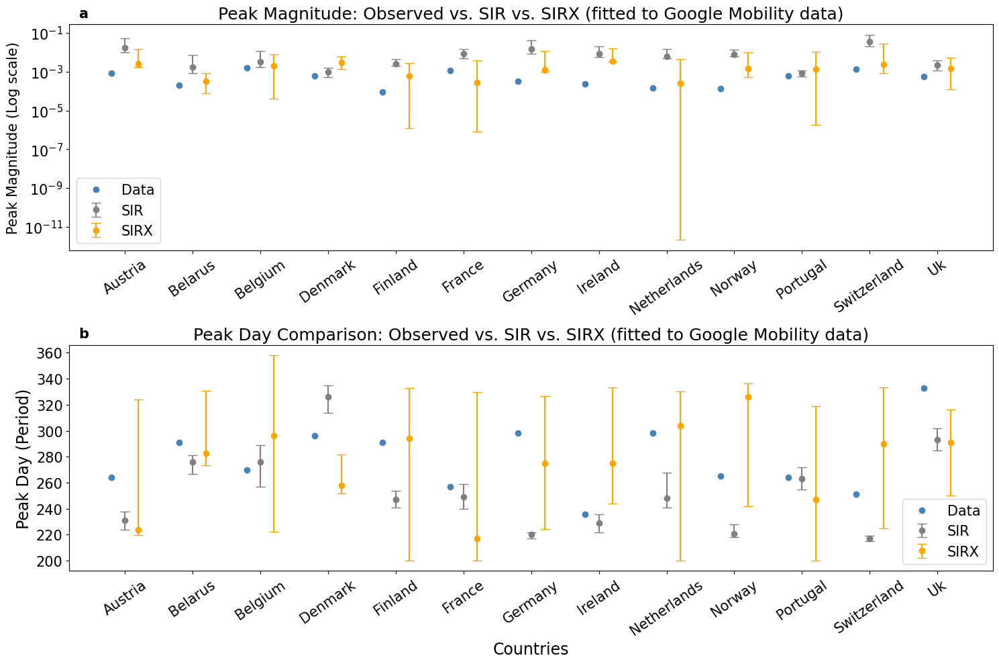

In [320]:
Peak_SIR
Peak_SIRX
Max_SIR
Max_SIRX
cutoff_peak #data peak values

Country = [name[:-7].capitalize() for name in parameterErr] 
Peaks_data = [pred_peak[name][1] for name in parameterErr]
Peaks_date = [pred_peak[name][2] for name in parameterErr]
Peaks_value = [pred_peak[name][0] for name in parameterErr]  
Peaks_sir0 = [Max_SIR[i][0] for i in range(len(Max_SIR))]
Peaks_sir1 = [Max_SIR[i][1] for i in range(len(Max_SIR))]
Peaks_sir2 = [Max_SIR[i][2] for i in range(len(Max_SIR))]
Peaks_sirx0 = [Max_SIRX[i][0] for i in range(len(Max_SIRX))]
Peaks_sirx1 = [Max_SIRX[i][1] for i in range(len(Max_SIRX))]
Peaks_sirx2 = [Max_SIRX[i][2] for i in range(len(Max_SIRX))]

# Country =  ['Austria', 'Belarus', 'Belgium', 'Denmark', 'Finland', 'France', 'Germany', 'Ireland', 'Netherlands', 'Norway', 'Portugal', 'United \n Kingdom', 'Switzerland']


x = np.arange(len(Country))
width = 0.25

plt.figure(figsize=(15, 10))
plt.subplot(2,1,1)

offset = 0.2

Peaks_sir0 = np.array(Peaks_sir0)
Peaks_sir1 = np.array(Peaks_sir1)
Peaks_sir2 = np.array(Peaks_sir2)
print(np.mean(Peaks_sir0), np.std(Peaks_sir0))
Peaks_sirx0 = np.array(Peaks_sirx0)
Peaks_sirx1 = np.array(Peaks_sirx1)
Peaks_sirx2 = np.array(Peaks_sirx2)
print(np.mean(Peaks_sirx0), np.std(Peaks_sirx0))
Peaks_data1 = np.array(Peaks_value)
print(np.mean(Peaks_data1), np.std(Peaks_data1))
sir_error = [Peaks_sir0 - Peaks_sir1, Peaks_sir2 - Peaks_sir0]
sirx_error = [abs(Peaks_sirx0 - Peaks_sirx1), Peaks_sirx2 - Peaks_sirx0]

# Plot each data set as a scatter point with error bars
plt.errorbar(x - offset, Peaks_data1, fmt='o', color='steelblue', label='Data')
plt.errorbar(x, Peaks_sir0, yerr=sir_error, fmt='o', color='gray', capsize=5, label='SIR')
plt.errorbar(x + offset, Peaks_sirx0, yerr=sirx_error, fmt='o', color='orange', capsize=5, label='SIRX')
plt.text(
    0.01, 1.02,                        # x, y position in axes fraction
    r"$\mathbf{a}$",                  # Bold using LaTeX
    transform=plt.gca().transAxes,    # Use axes coordinates
    fontsize=15,
    va='bottom',
    ha='left')
plt.xticks(x, Country, rotation=35, fontsize=15)
plt.yscale("log")
plt.yticks(fontsize = 15)
plt.ylabel("Peak Magnitude (Log scale)", fontsize=15)
plt.title("Peak Magnitude: Observed vs. SIR vs. SIRX (fitted to Google Mobility data)", fontsize=18)
plt.legend(fontsize = 15)


Peaks_sir0 = [Peak_SIR[i][0] for i in range(len(Peak_SIR))]
Peaks_sir1 = [Peak_SIR[i][1] for i in range(len(Peak_SIR))]
Peaks_sir2 = [Peak_SIR[i][2] for i in range(len(Peak_SIR))]
Peaks_sirx0 = [Peak_SIRX[i][0] for i in range(len(Peak_SIRX))]
Peaks_sirx1 = [Peak_SIRX[i][1] for i in range(len(Peak_SIRX))]
Peaks_sirx2 = [Peak_SIRX[i][2] for i in range(len(Peak_SIRX))]

width = 0.25


Peaks_sir0 = np.array(Peaks_sir0)
Peaks_sir1 = np.array(Peaks_sir1)
Peaks_sir2 = np.array(Peaks_sir2)
print(np.mean(Peaks_sir0), np.std(Peaks_sir0))
Peaks_sirx0 = np.array(Peaks_sirx0)
Peaks_sirx1 = np.array(Peaks_sirx1)
Peaks_sirx2 = np.array(Peaks_sirx2)
print(np.mean(Peaks_sirx0), np.std(Peaks_sirx0))
Peaks_data = np.array(Peaks_data)
print(np.mean(Peaks_data), np.std(Peaks_data))

plt.subplot(2,1,2)
offset = 0.2
sir_error = [Peaks_sir0 - Peaks_sir1, Peaks_sir2 - Peaks_sir0]
sirx_error = [Peaks_sirx0 - Peaks_sirx1, Peaks_sirx2 - Peaks_sirx0]

# Plot each data set as a scatter point with error bars
plt.errorbar(x - offset, Peaks_data, fmt='o', color='steelblue', label='Data')
plt.errorbar(x, Peaks_sir0, yerr=sir_error, fmt='o', color='gray', capsize=5, label='SIR')
plt.errorbar(x + offset, Peaks_sirx0, yerr=sirx_error, fmt='o', color='orange', capsize=5, label='SIRX')

# Annotated label
plt.text(
    0.01, 1.02,
    r"$\mathbf{b}$",
    transform=plt.gca().transAxes,
    fontsize=15,
    va='bottom',
    ha='left'
)

# Labels and formatting
plt.xticks(x, Country, rotation=35, fontsize=15)
plt.yticks(fontsize = 15)
plt.ylabel("Peak Day (Period)", fontsize=17)
plt.xlabel("Countries", fontsize=17)
plt.title("Peak Day Comparison: Observed vs. SIR vs. SIRX (fitted to Google Mobility data)", fontsize=18)
plt.legend(fontsize = 15)
plt.tight_layout()

plt.savefig("peak_mag_day(google).jpeg", dpi = 300)
plt.show()

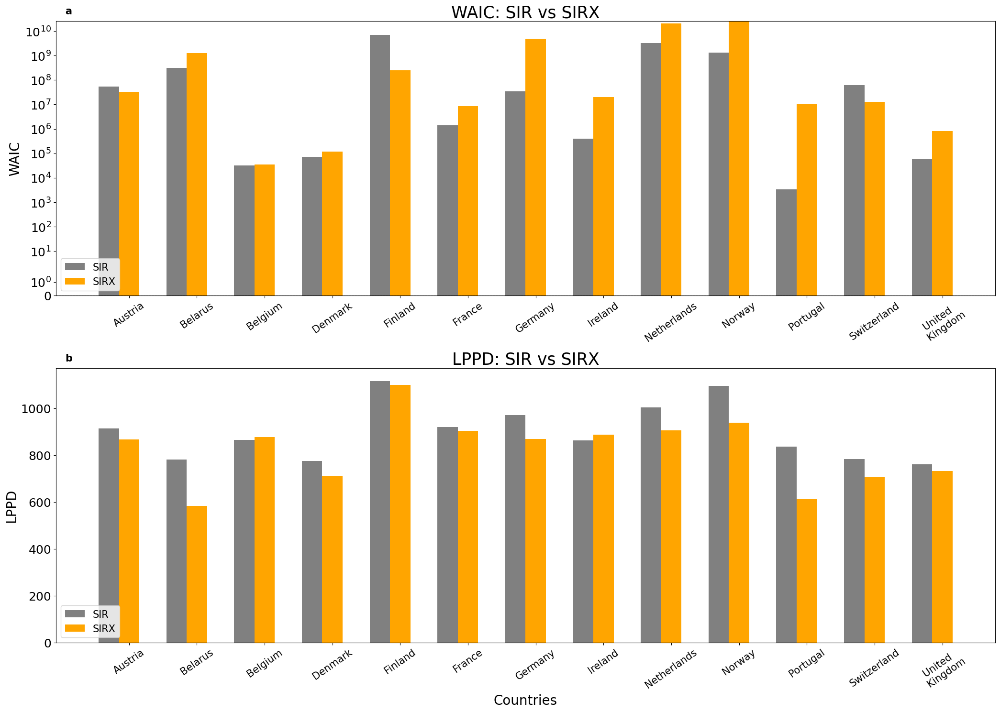

In [280]:
Countries = ['Austria','Belarus','Belgium','Denmark','Finland','France','Germany',
 'Ireland','Netherlands','Norway','Portugal','Switzerland','United \n Kingdom']
# WAIC_Sirx, LPPD_Sirx, P_WAIC_Sirx
plt.figure(figsize = (21,15))
plt.subplot(2,1,1)
plt.bar(np.arange(len(Countries))+0.3,WAIC_Sir, 0.3, color= 'gray', align='center', label = 'SIR')
plt.bar(np.arange(len(Countries))+0.3*2,WAIC_Sirx, 0.3,  color = "orange", align='center', label = "SIRX")
plt.axhline(0, color='black', linewidth=0.8, linestyle='--')
plt.xticks(np.arange(len(Countries))+0.3*2,Countries,  rotation = 35, fontsize = 15)
plt.text(
    0.01, 1.02,                        # x, y position in axes fraction
    r"$\mathbf{a}$",                  # Bold using LaTeX
    transform=plt.gca().transAxes,    # Use axes coordinates
    fontsize=15,
    va='bottom',
    ha='left')
plt.title("WAIC: SIR vs SIRX", fontsize = 25)
plt.ylabel("WAIC", fontsize = 20)
# plt.xlabel("Countries", fontsize = 15)
plt.yticks(fontsize = 18)
plt.yscale("symlog")
# plt.grid()
plt.legend(loc = 'lower left',  fontsize = 15)
# plt.savefig("Combined_Results_all_Area_7ma.jpg", dpi = 150)



plt.subplot(2,1,2)

plt.bar(np.arange(len(Countries))+0.3,LPPD_Sir, 0.3,color= 'gray', align='center', label = 'SIR')
plt.bar(np.arange(len(Countries))+0.3*2,LPPD_Sirx, 0.3, color = "orange" , align='center', label = "SIRX")
# plt.bar(np.arange(len(Countries))+0.3*3,RMSE_SIRX_eta, 0.3, color = "orange", align='center', label = "SIRX")
plt.xticks(np.arange(len(Countries))+0.3*2,Countries,  rotation = 35, fontsize = 15)
plt.legend(loc = 'lower left', fontsize = 15)
plt.text(
    0.01, 1.02,                        # x, y position in axes fraction
    r"$\mathbf{b}$",                  # Bold using LaTeX
    transform=plt.gca().transAxes,    # Use axes coordinates
    fontsize=15,
    va='bottom',
    ha='left')
plt.title("LPPD: SIR vs SIRX", fontsize = 25)
plt.ylabel("LPPD", fontsize = 20)
plt.xlabel("Countries", fontsize = 20)
plt.yticks(fontsize = 18)
# plt.yscale("symlog")
# plt.grid()
plt.tight_layout()
plt.savefig("waic_lppd_prediction.jpeg", dpi = 300)
plt.show()


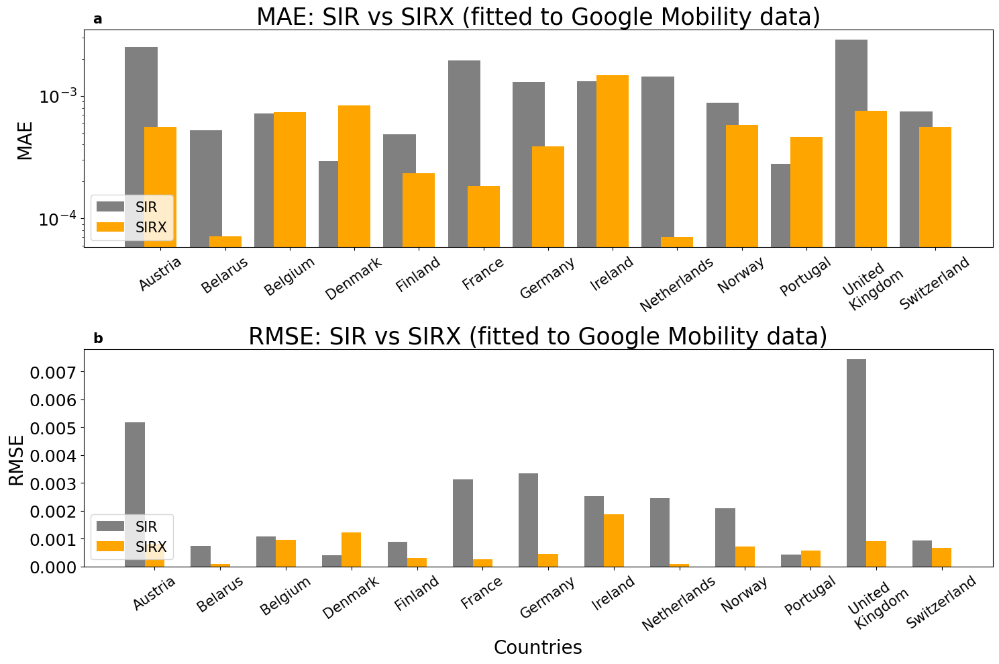

In [321]:
Countries = ['Austria','Belarus','Belgium','Denmark','Finland','France','Germany',
 'Ireland','Netherlands','Norway','Portugal','United \n Kingdom','Switzerland']

plt.figure(figsize = (15,10))
plt.subplot(2,1,1)
plt.bar(np.arange(len(Countries))+0.3,MAE_SIR, 0.5, color= 'gray', align='center', label = 'SIR')
plt.bar(np.arange(len(Countries))+0.3*2,MAE_SIRX, 0.5,  color = "orange", align='center', label = "SIRX")
plt.xticks(np.arange(len(Countries))+0.3*2,Countries,  rotation = 35, fontsize = 15)
plt.text(
    0.01, 1.02,                        # x, y position in axes fraction
    r"$\mathbf{a}$",                  # Bold using LaTeX
    transform=plt.gca().transAxes,    # Use axes coordinates
    fontsize=15,
    va='bottom',
    ha='left')
plt.title("MAE: SIR vs SIRX (fitted to Google Mobility data)", fontsize = 25)
plt.ylabel("MAE", fontsize = 20)
# plt.xlabel("Countries", fontsize = 15)
plt.yticks(fontsize = 18)
plt.yscale("log")
# plt.grid()
plt.legend(loc = 'lower left',  fontsize = 15)
# plt.savefig("Combined_Results_all_Area_7ma.jpg", dpi = 150)



plt.subplot(2,1,2)

plt.bar(np.arange(len(Countries))+0.3,RMSE_SIR, 0.3,color= 'gray', align='center', label = 'SIR')
plt.bar(np.arange(len(Countries))+0.3*2,RMSE_SIRX, 0.3, color = "orange" , align='center', label = "SIRX")
# plt.bar(np.arange(len(Countries))+0.3*3,RMSE_SIRX_eta, 0.3, color = "orange", align='center', label = "SIRX")
plt.xticks(np.arange(len(Countries))+0.3*2,Countries,  rotation = 35, fontsize = 15)
plt.legend(loc = 'lower left', fontsize = 15)
plt.text(
    0.01, 1.02,                        # x, y position in axes fraction
    r"$\mathbf{b}$",                  # Bold using LaTeX
    transform=plt.gca().transAxes,    # Use axes coordinates
    fontsize=15,
    va='bottom',
    ha='left')
plt.title("RMSE: SIR vs SIRX (fitted to Google Mobility data)", fontsize = 25)
plt.ylabel("RMSE", fontsize = 20)
plt.xlabel("Countries", fontsize = 20)
plt.yticks(fontsize = 18)
# plt.grid()
plt.tight_layout()
plt.savefig("mae_rmse(google).jpeg", dpi = 300)
plt.show()


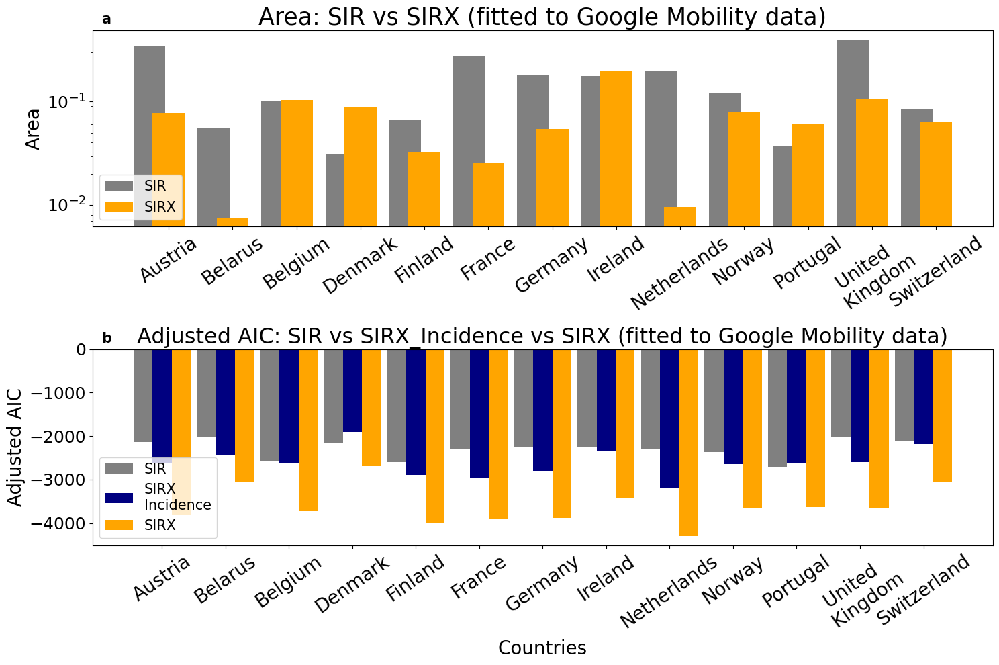

In [324]:

Countries = ['Austria','Belarus','Belgium','Denmark','Finland','France','Germany',
 'Ireland','Netherlands','Norway','Portugal','United \n Kingdom','Switzerland']

plt.figure(figsize = (15,10))
plt.subplot(2,1,1)
plt.bar(np.arange(len(Countries))+0.3,AREA_SIR, 0.5, color= 'gray', align='center', label = 'SIR')
plt.bar(np.arange(len(Countries))+0.3*2,AREA_SIRX, 0.5,  color = "orange", align='center', label = "SIRX")
plt.xticks(np.arange(len(Countries))+0.3*2,Countries,  rotation = 35, fontsize = 20)
plt.text(
    0.01, 1.02,                        # x, y position in axes fraction
    r"$\mathbf{a}$",                  # Bold using LaTeX
    transform=plt.gca().transAxes,    # Use axes coordinates
    fontsize=15,
    va='bottom',
    ha='left')
plt.title("Area: SIR vs SIRX (fitted to Google Mobility data)", fontsize = 25)
plt.ylabel("Area", fontsize = 20)
# plt.xlabel("Countries", fontsize = 15)
plt.yticks(fontsize = 18)
plt.yscale("log")
# plt.grid()
plt.legend(loc = 'lower left',  fontsize = 15)
# plt.savefig("Combined_Results_all_Area_7ma.jpg", dpi = 150)



plt.subplot(2,1,2)

plt.bar(np.arange(len(Countries))+0.3,AICC_Sirp, 0.3,color= 'gray', align='center', label = 'SIR')
plt.bar(np.arange(len(Countries))+0.3*2,AICC_Sirxp, 0.3, color = "navy" , align='center', label = "SIRX\nIncidence")
plt.bar(np.arange(len(Countries))+0.3*3,AICC_Sirxp_eta, 0.3, color = "orange", align='center', label = "SIRX")
plt.xticks(np.arange(len(Countries))+0.3*2,Countries,  rotation = 35, fontsize = 20)
plt.legend(loc = 'lower left', fontsize = 15)
plt.text(
    0.01, 1.02,                        # x, y position in axes fraction
    r"$\mathbf{b}$",                  # Bold using LaTeX
    transform=plt.gca().transAxes,    # Use axes coordinates
    fontsize=15,
    va='bottom',
    ha='left')
plt.title("Adjusted AIC: SIR vs SIRX_Incidence vs SIRX (fitted to Google Mobility data)", fontsize = 23)
plt.ylabel("Adjusted AIC", fontsize = 20)
plt.xlabel("Countries", fontsize = 20)
plt.yticks(fontsize = 18)
# plt.grid()
plt.tight_layout()
plt.savefig("Area_AIC(google).jpeg", dpi = 300)
plt.show()


# AICc

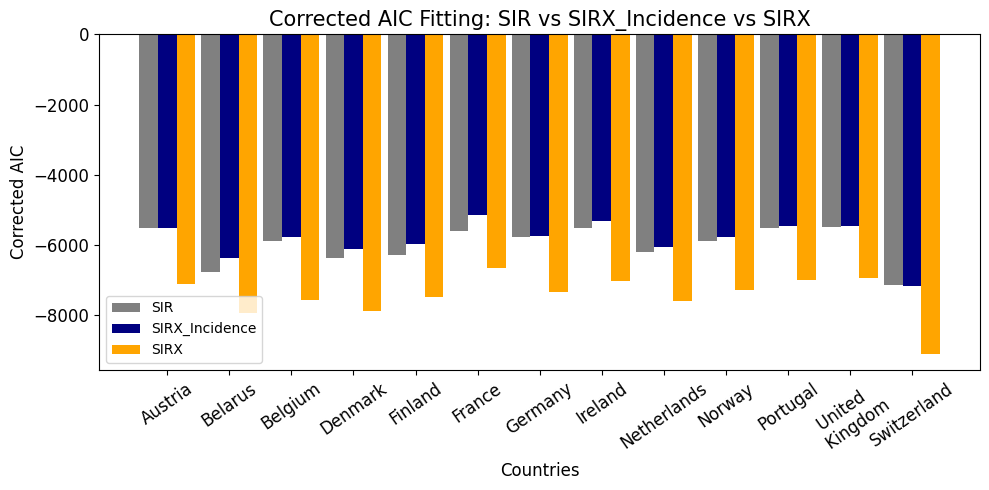

In [309]:
plt.figure(figsize = (10,5))
plt.bar(np.arange(len(Countries))+0.3,AICC_Sir, 0.3, color= "gray", align='center', label = 'SIR')
plt.bar(np.arange(len(Countries))+0.3*2,AICC_Sirx, 0.3, color = "navy" , align='center', label = "SIRX_Incidence")
plt.bar(np.arange(len(Countries))+0.3*3,AICC_Sirx_eta, 0.3,  color = "orange", align='center', label = "SIRX")
plt.xticks(np.arange(len(Countries))+0.3*2,Countries,  rotation = 35, fontsize = 12)
plt.legend(loc = 'lower left', fontsize = 10)
plt.title("Corrected AIC Fitting: SIR vs SIRX_Incidence vs SIRX",y = 1.0,  fontsize = 15)
plt.ylabel("Corrected AIC", fontsize = 12)
plt.xlabel("Countries", fontsize = 12)
plt.yticks(fontsize = 12)

plt.tight_layout()
# plt.savefig("Fitting_AIC.jpeg", dpi = 300)
plt.show()

# Violin Plot

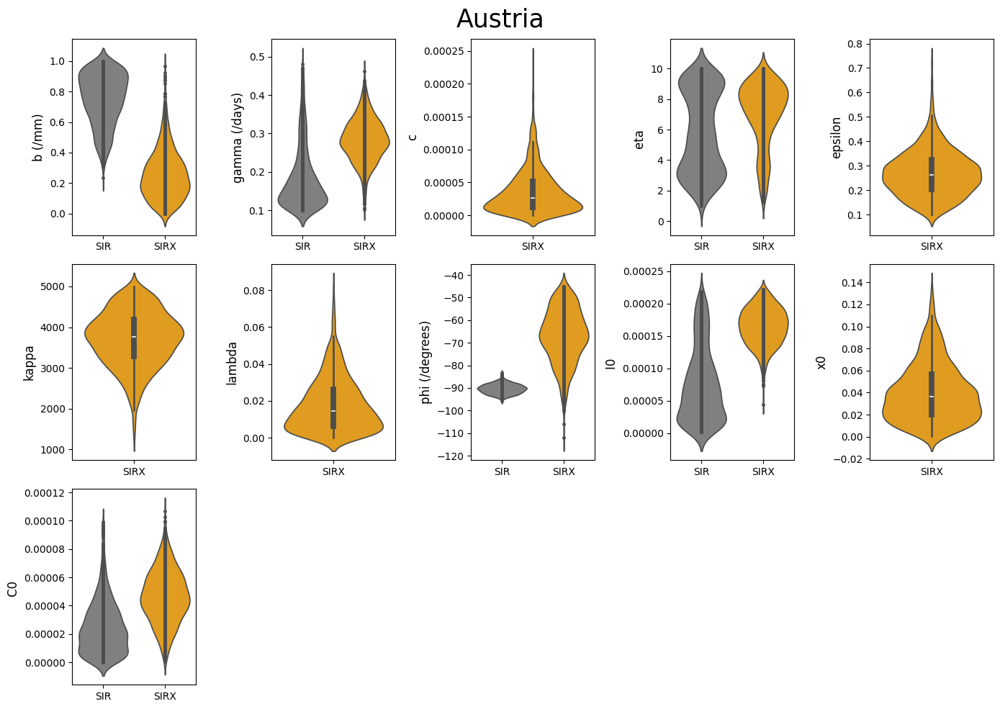

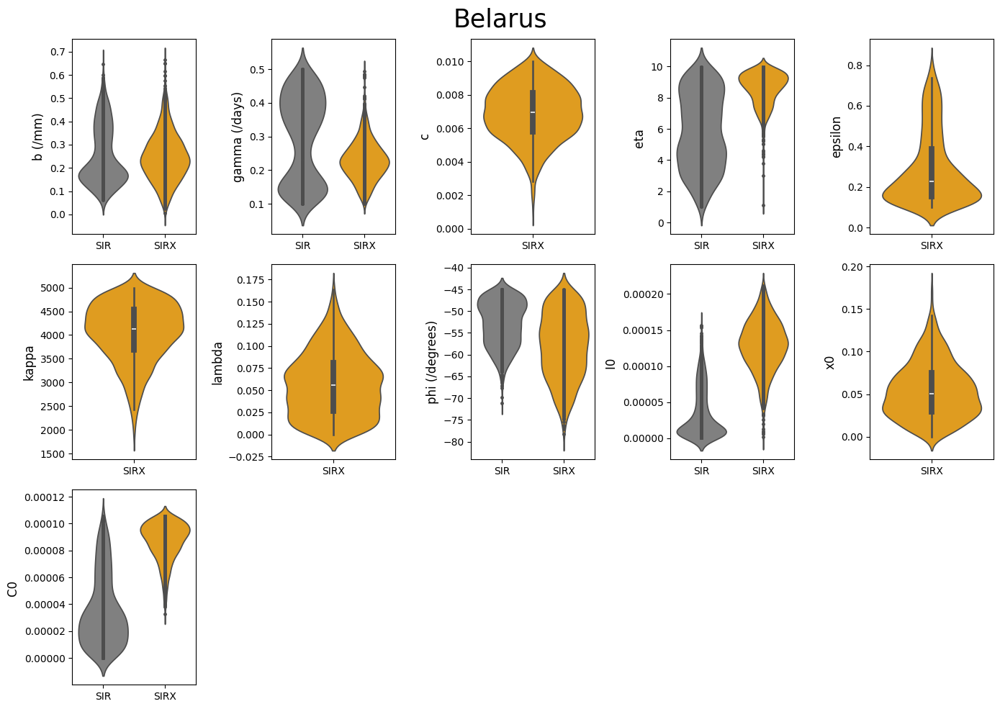

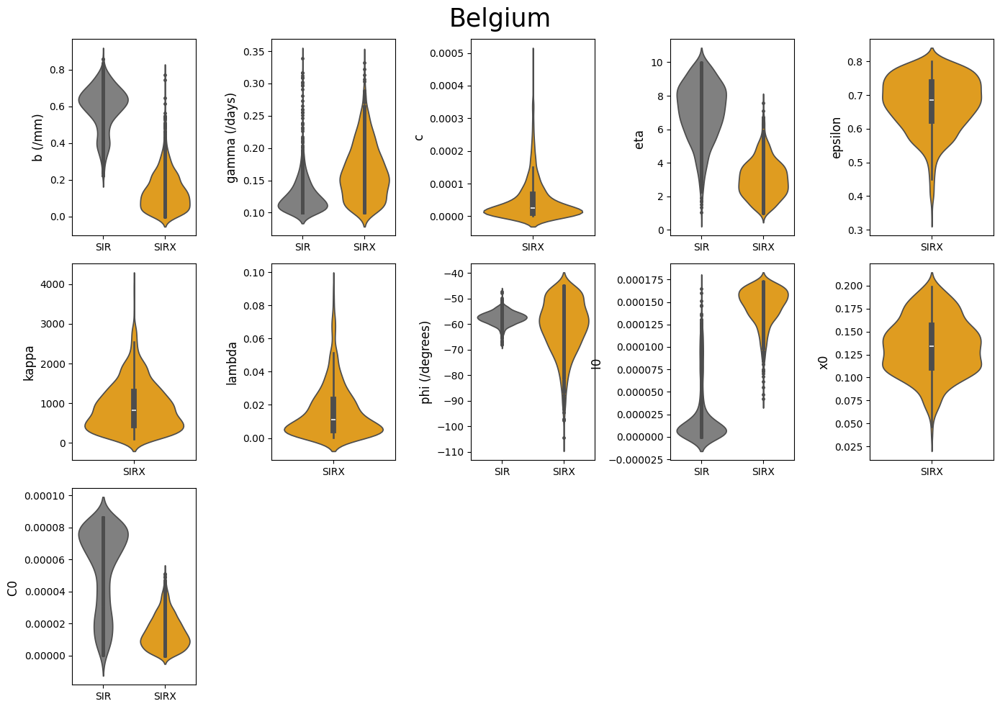

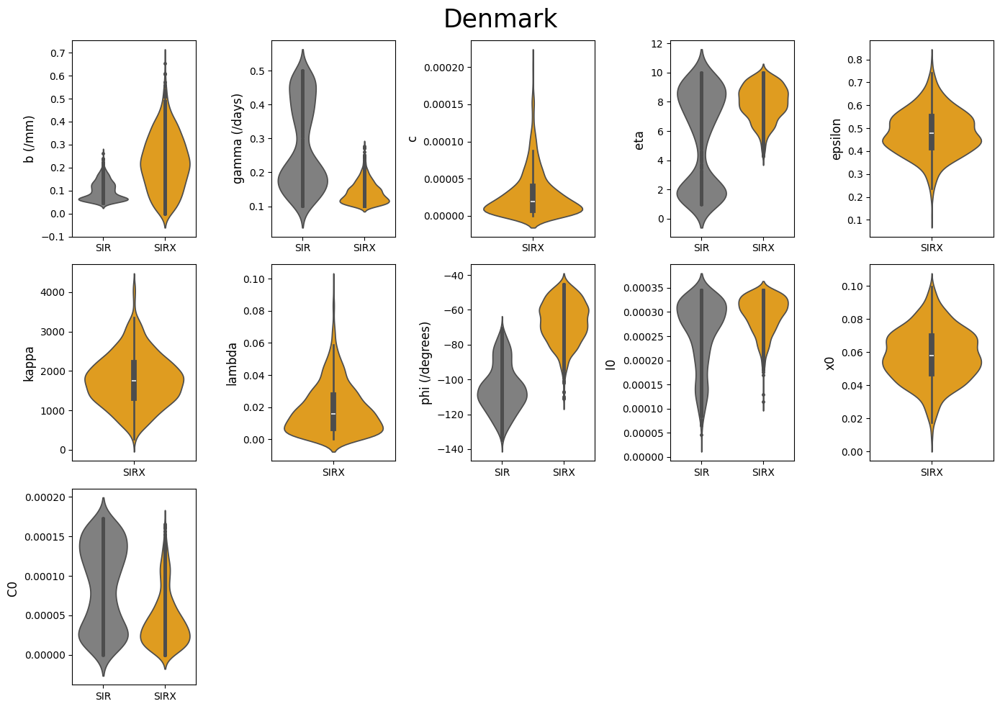

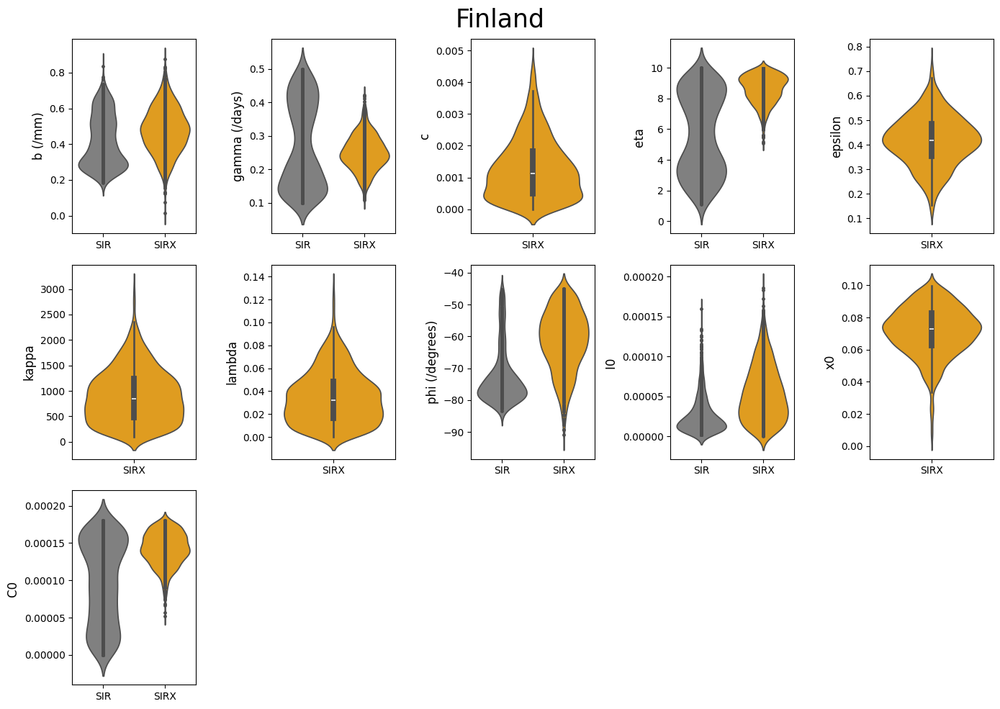

...

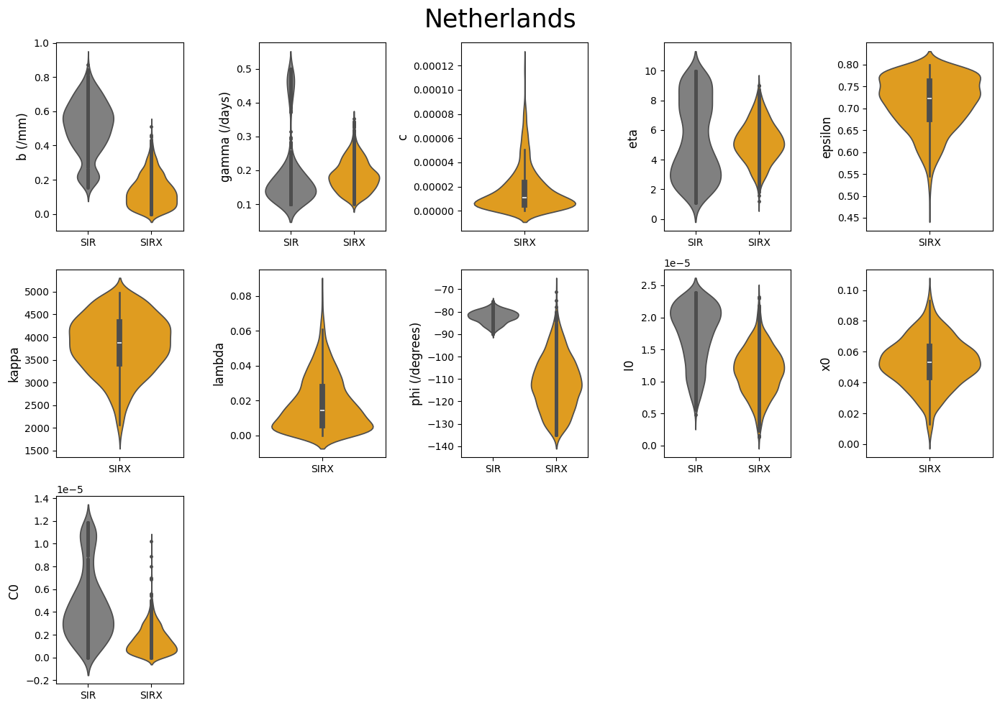

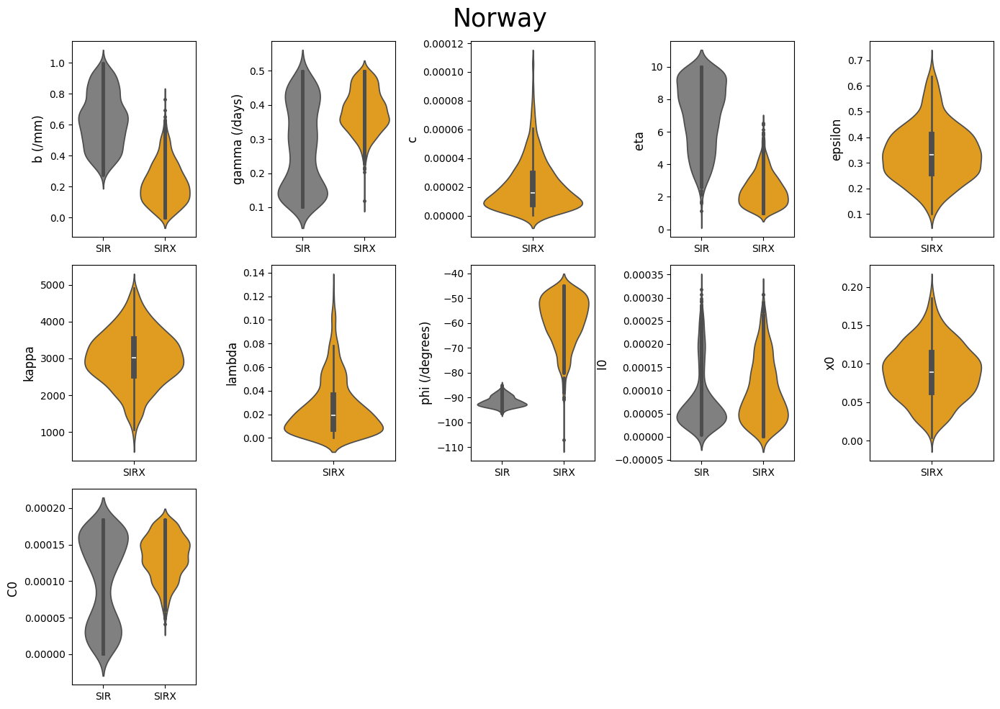

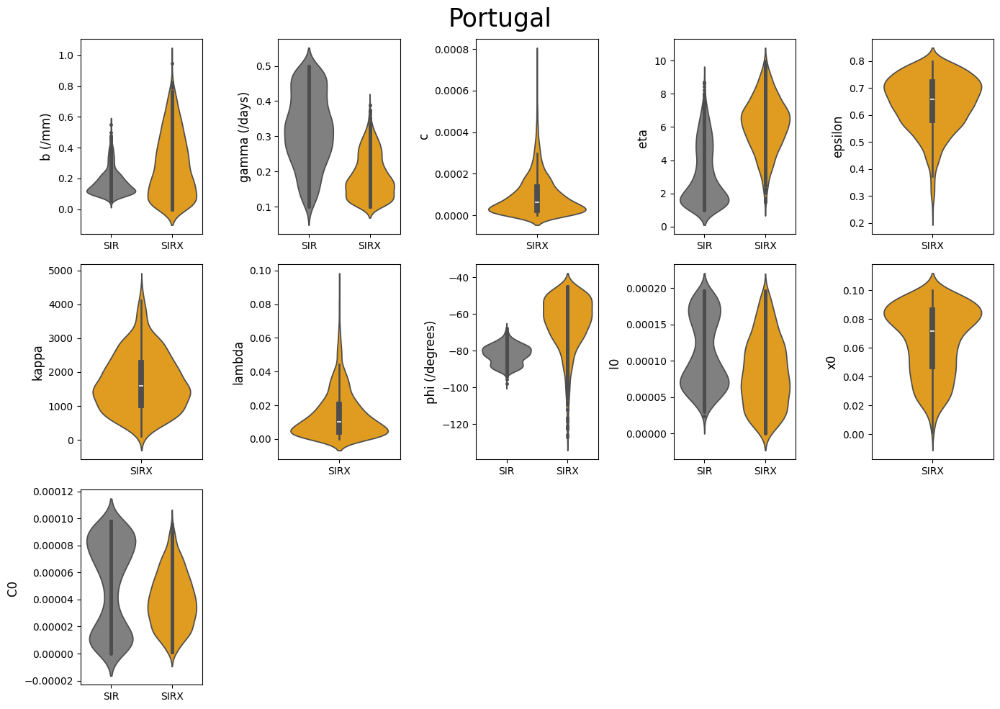

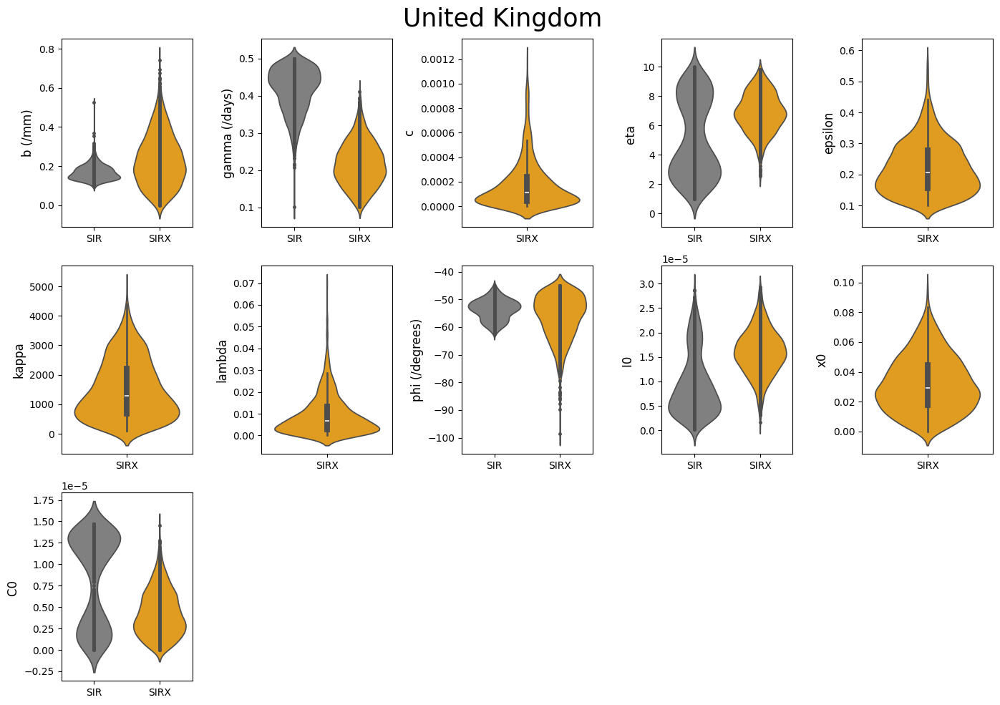

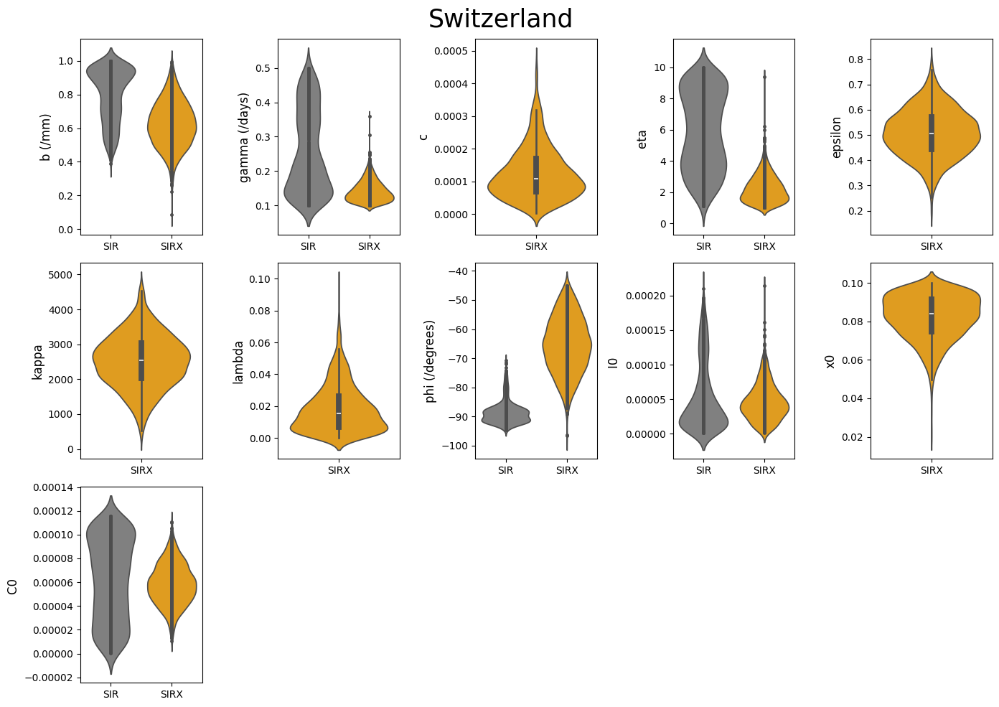

In [36]:
sir = np.random.choice(['SIR'], size=1000)
sirx = np.random.choice(['SIRX'], size=1000)

category = np.concatenate([sir, sirx ])

column_names = ['b', 'gamma', 'c', 'eta_0', 'epsilon', 'eta_1', 'kappa', 'lambda',
       'phi', 'I0', 'x0', 'C0']
column_unit = {"beta":" ", 'b': " (/mm)",'phi':" (/degrees)", "gamma":" (/days)", "kappa":" (/days)",
                'c':" ", 'eta': " ", 'epsilon': " ", 'eta_1': " ", 'I0':" ", 'lambda':" ",
         'x0':" ", 'C0': " "}

'''Some of the particles do not have units but the values are constant throughout the time series. 
My guess is other particles can de descibed as per day'''


for name in parameterErr:
    Particle_Sir = pd.read_csv(path1 + '/' + name[:-4] + "_sir_latest.csv") 
    Particle_Sirx = pd.read_csv(path1 + '/' + name[:-7] + "_final_par.csv")
    Particle_Sir.rename(columns={"Ii0" : "C0", "eta_0": "eta"}, inplace = True)
    Particle_Sirx.rename(columns={"eta_0": "eta"}, inplace = True)
    i = 0
    plt.figure(figsize=(14, 10))
    if name[:-7] == "uk":
        header = "United Kingdom"
    else:
        header = name[:-7].capitalize()
    plt.suptitle(header, fontsize = 25)
    for par in Particle_Sirx.columns[2:-2]:
        plt.subplot(3,5,i+1)
        if par in Particle_Sir.columns[:] and par in Particle_Sirx.columns[:]: 
            parameter = np.concatenate([Particle_Sir[par][:1000] , Particle_Sirx[par][:1000]])
            data = pd.DataFrame({'category': category,'value': parameter})
            sns.violinplot(x='category', y='value', data=data, palette=['grey','orange'], inner = 'points', hue = "category", legend = False)
            plt.ylabel(par + column_unit[par], fontsize = 12)
            plt.xlabel('')
            
        elif par not in Particle_Sir.columns[:]: 
            parameter = Particle_Sirx[par][:1000]
            data1 = pd.DataFrame({'category': category[1000:],'value': parameter})
            sns.violinplot(x='category', y='value', data=data1 , hue = "category", palette=['orange'])
            plt.ylabel(par, fontsize = 12)
            plt.xlabel('')
        i +=1
    plt.tight_layout()
    plt.savefig(name[:-7] + "_violin_final.jpeg", dpi = 300)

plt.show()



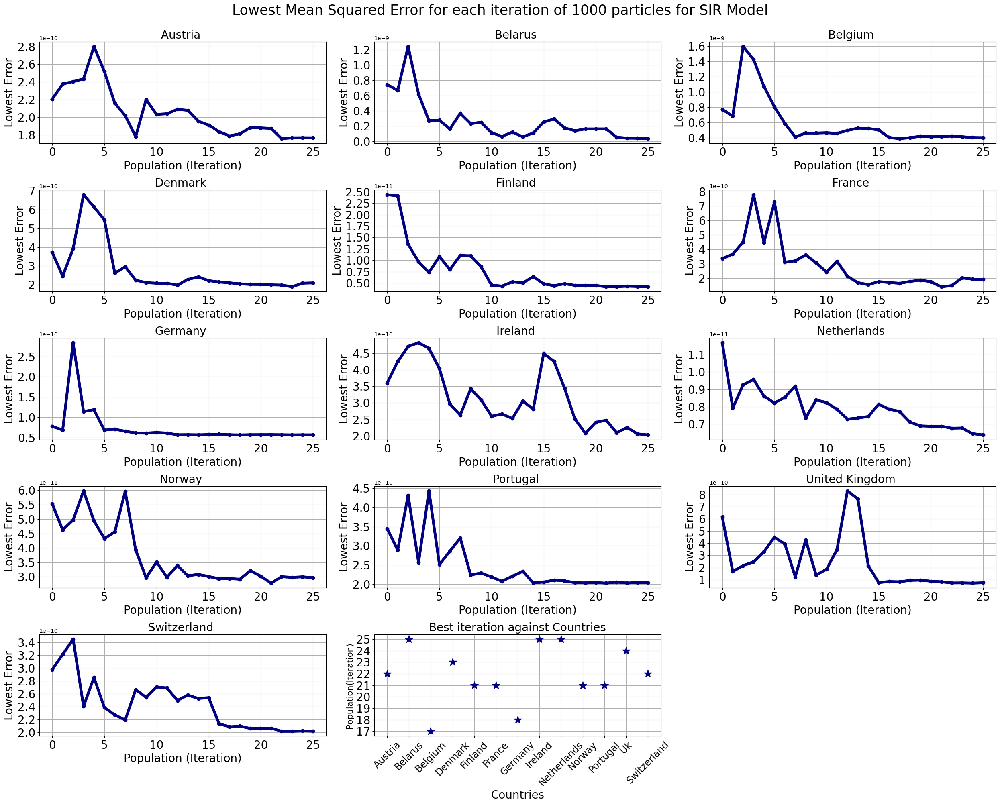

[22, 25, 17, 23, 21, 21, 18, 25, 25, 21, 21, 24, 22]


In [33]:
path2 = os.getcwd() + "/SIRX:SIR_Particles"
Country = [i[:-7].capitalize() for i in parameterErr]

j = 1
lowest_error_index = []
plt.figure(figsize = (25,20))
plt.suptitle("Lowest Mean Squared Error for each iteration of 1000 particles for SIR Model", fontsize = 25, y = 1.0)
for name in parameterErr[:]:
    data = pd.read_csv(path2 + "/" + name[:-4] + "_12_sir_trial.csv") 
    # data = pd.read_csv( path2 + "/" + name[:-4] + "7ma_1_sirx_trial.csv")
    # data = pd.read_csv(file)
    error = []
    n = np.arange(0,26000, 1000) #creates a lsit with interval 1000
    # print(n)
    plt.subplot(5,3,j)
    for i in n:
        error.append(data['Error'][i])
    lowest_error_index.append(error.index(min(error)))
    plt.plot(error,"o-", color = 'navy', linewidth=5)
    # plt.plot(error[::-1],"+", error,"o-", linewidth=5)
    plt.xticks(fontsize = 20)
    plt.yticks(fontsize = 20)
    plt.xlabel("Population (Iteration)", fontsize = 20)
    plt.ylabel("Lowest Error", fontsize = 20)
    title = name[:-7].capitalize()
    if title == "Uk":
        title = "United Kingdom"
    plt.title (f"{title} ", fontsize = 20)
    j = j + 1
    plt.grid()
plt.subplot(5,3,14)
plt.plot(Country,lowest_error_index, "*", color = "navy" , markersize=15 )
plt.xticks(rotation = 45, fontsize = 17)
plt.yticks(fontsize = 20)
plt.xlabel("Countries", fontsize =20)
plt.ylabel("Population(Iteration)", fontsize = 15)
plt.title("Best iteration against Countries", fontsize = 20)
plt.grid()
plt.tight_layout()
plt.savefig("SIR_iterations.jpeg", dpi = 300)
plt.show()

print(lowest_error_index)

# Scatter Plot

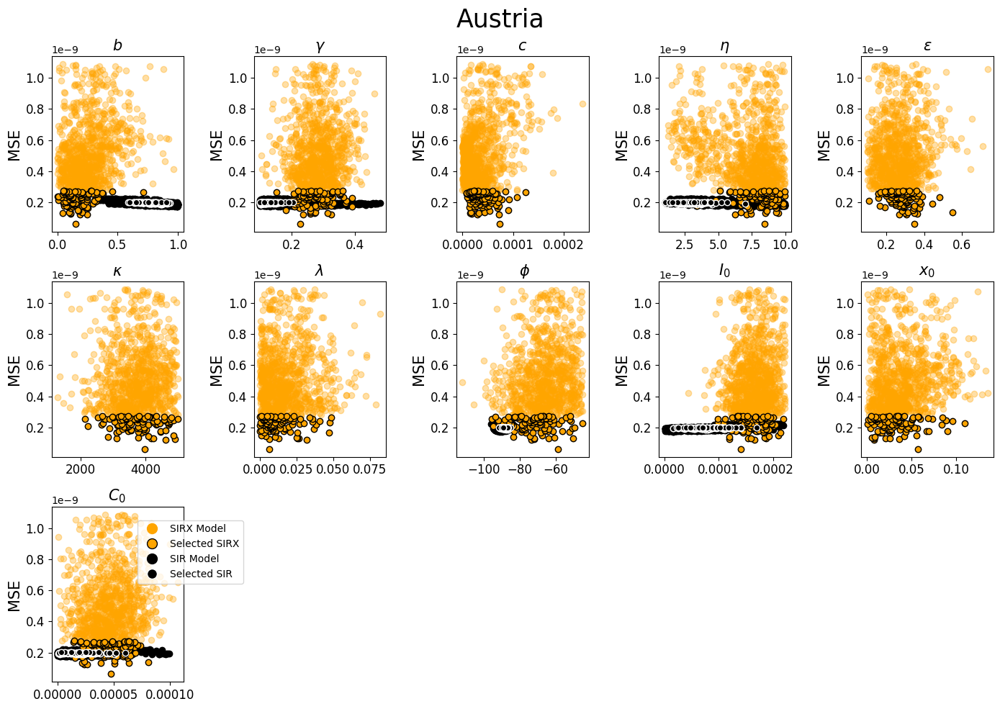

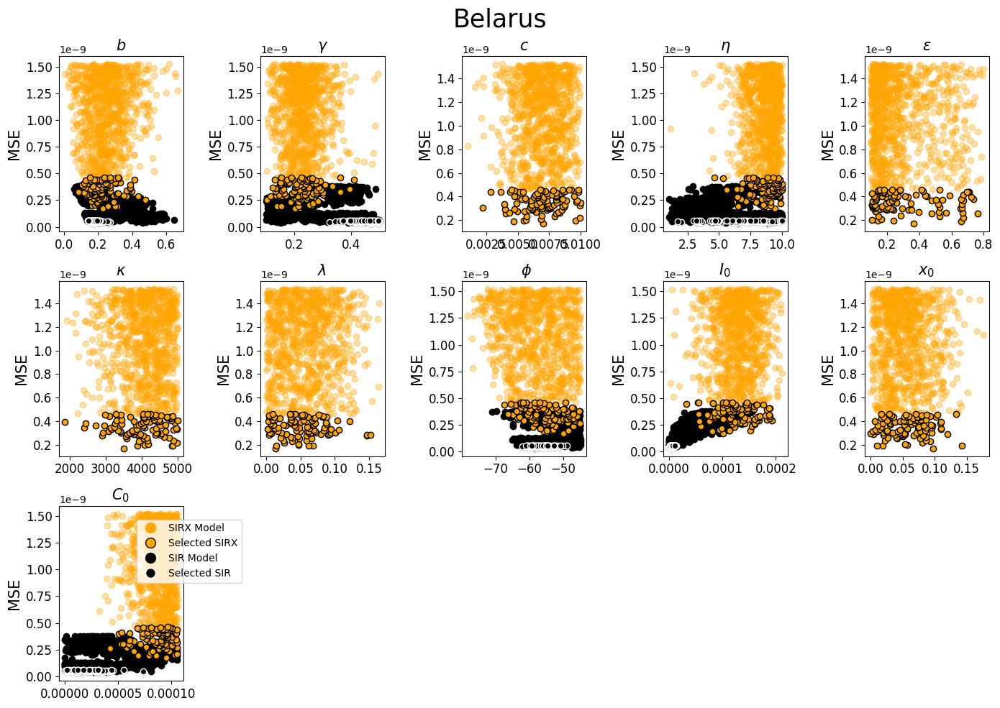

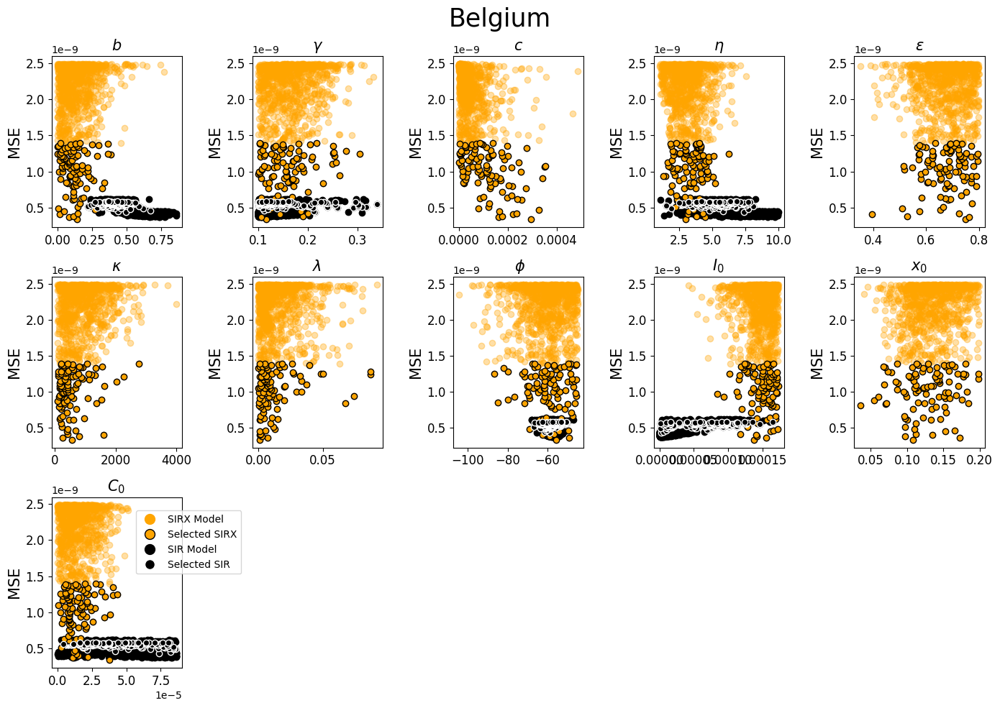

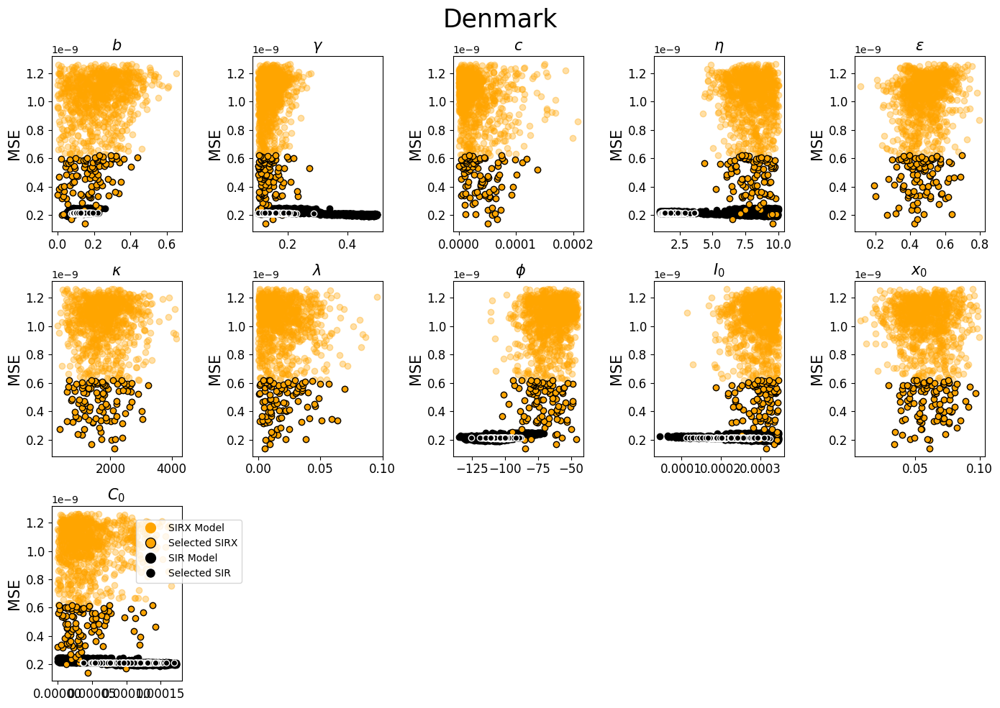

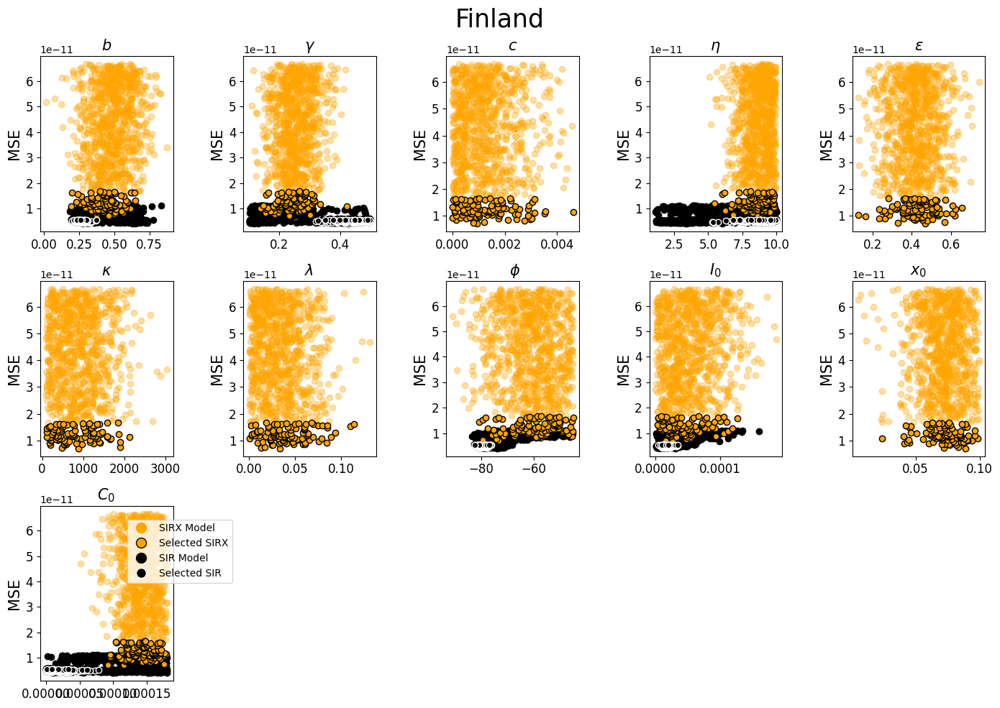

...

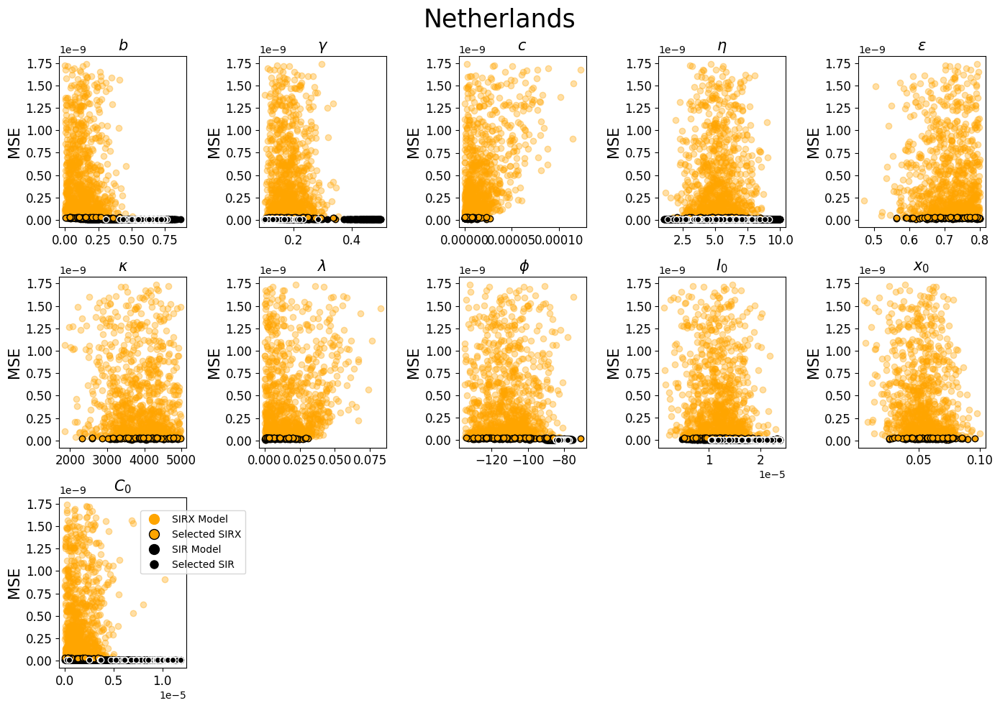

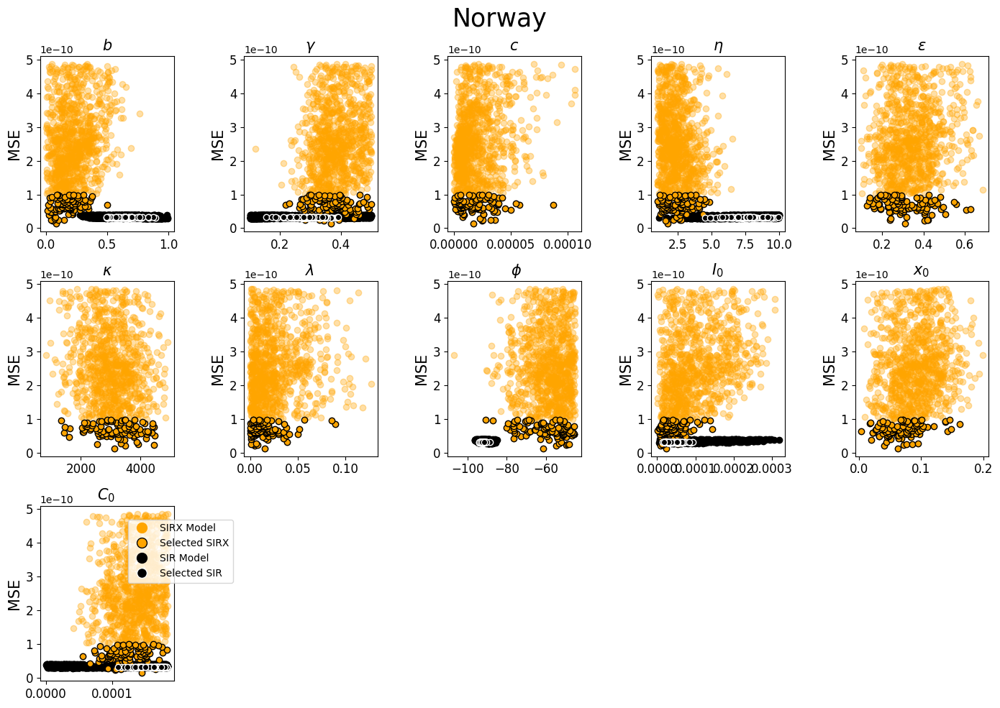

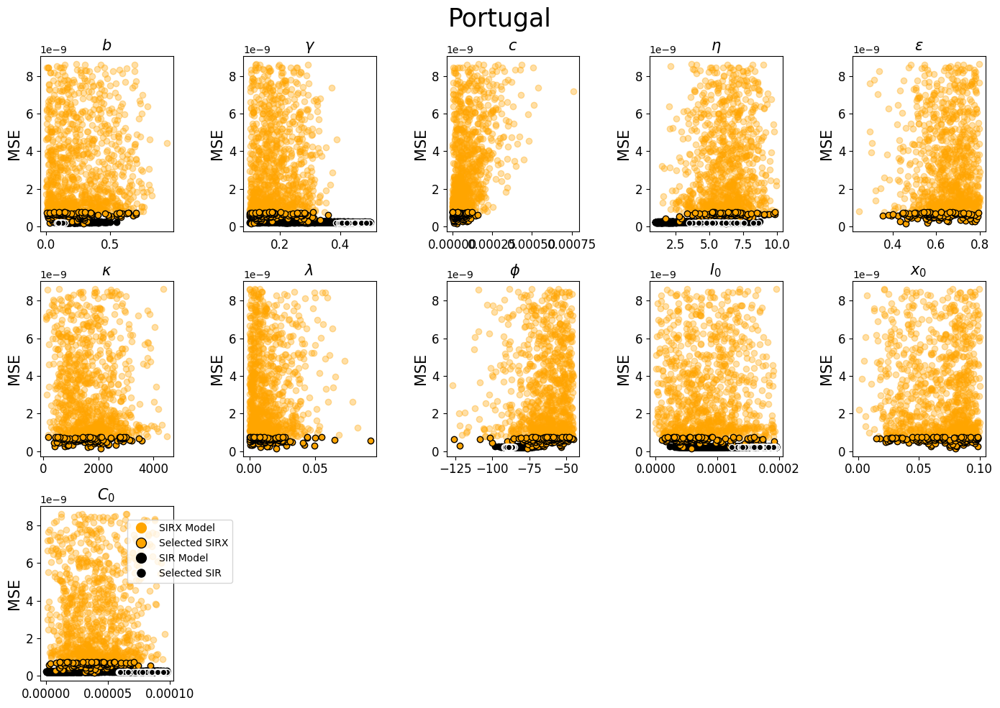

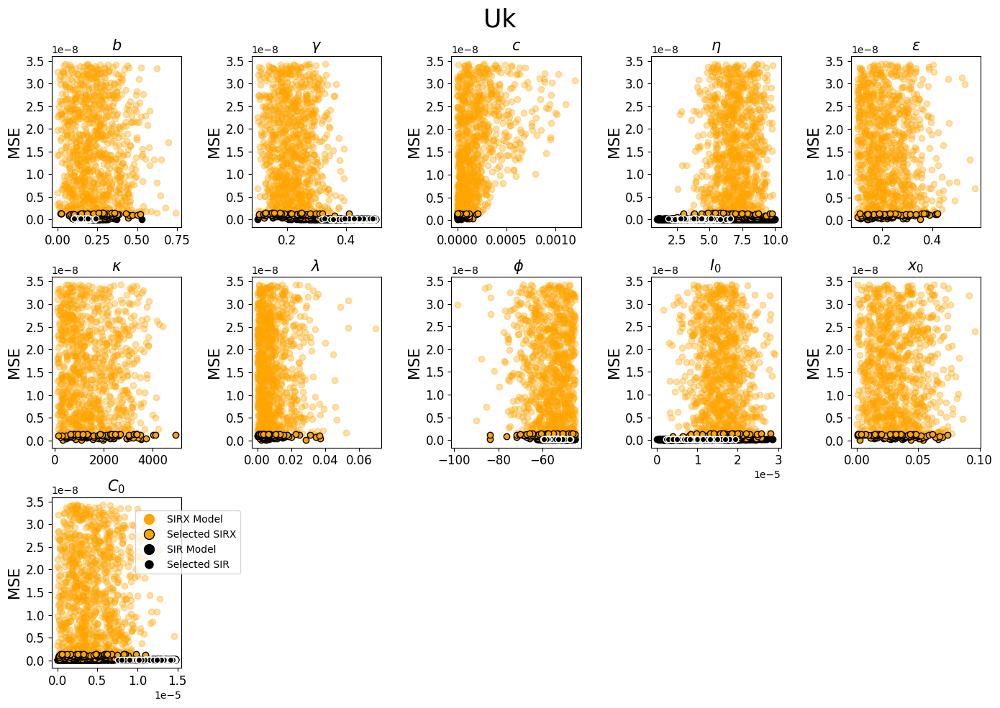

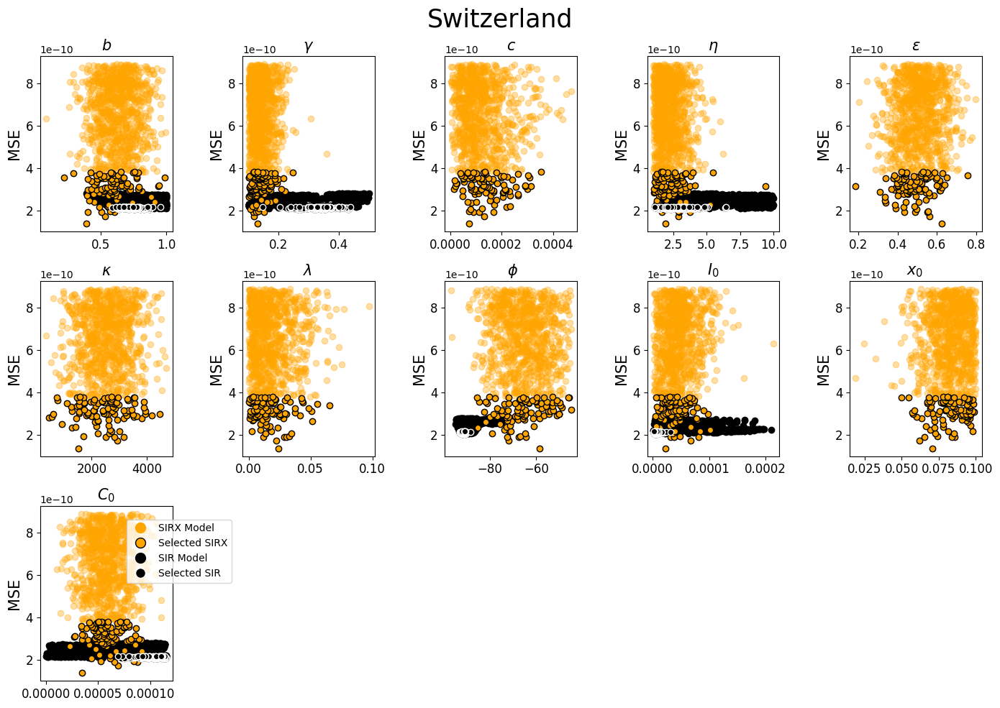

In [27]:
column_unit = {"beta":r"$\beta$ ", 'b': r"$b$",'phi':" $\\phi$", "gamma":"$\\gamma$", "kappa": "$\\kappa$",
                'c':"$c$ ", 'eta_0': "$\\eta$ ", 'epsilon': "$\\epsilon$", 'eta_1': "$\\eta$ ", 'I0':"$I_0$ ", 'lambda':"$\\lambda$ ",
         'x0':"$x_0$ ", 'C0': "$C_0$ "}

for name in parameterErr:
    Particle_Sir = pd.read_csv( path1 + "/" + name[:-4] + "_sir_latest.csv") 
    Particle_Sirx = pd.read_csv( path1 + "/" + name[:-7] + "_final_par.csv")
    Particle_Sirx.rename(columns={'eta': 'eta_0'}, inplace=True)
    Particle_Sir.rename(columns={"Ii0" : "C0"}, inplace = True)
    

    i = 0
    plt.figure(figsize=(14, 10))
    plt.suptitle(f"{name[:-7].capitalize()}", fontsize = 25)
    for par in Particle_Sirx.columns[2:-2]:
        fig = plt.subplot(3,5,i+1)
        if par in Particle_Sir.columns[:] and par in Particle_Sirx.columns[:]: 
            plt.scatter(Particle_Sirx[par][:1000], Particle_Sirx['Error_I'][:1000], color = 'orange', alpha = 0.35, label = "SIRX")
            plt.scatter(Particle_Sir[par][:1000], Particle_Sir['Error'][:1000], color = 'black', label = "SIR")
            plt.scatter(Particle_Sirx[par][:100], Particle_Sirx['Error_I'][:100], color = 'orange', edgecolors='black', label="Selected SIRX")
            plt.scatter(Particle_Sir[par][:100], Particle_Sir['Error'][:100], color = 'black',  edgecolors='white', label="Selected SIR")
            plt.ylabel('MSE', fontsize = 15)
            plt.xticks(fontsize = 12)
            plt.yticks(fontsize = 12)
            plt.title(column_unit[par],  fontsize = 15)
            
        elif par not in Particle_Sir.columns[:]: 
            plt.scatter(Particle_Sirx[par][:1000], Particle_Sirx['Error_I'][:1000], color = 'orange', alpha = 0.35, label = "SIRX")
            plt.scatter(Particle_Sirx[par][:100], Particle_Sirx['Error_I'][:100], color = 'orange' ,edgecolors='black', label="Selected SIRX")
            plt.ylabel('MSE', fontsize = 15)
            plt.xticks(fontsize = 12)
            plt.yticks(fontsize = 12)
            plt.title(column_unit[par],  fontsize = 15)
        i +=1

    delta_handles = [
    plt.Line2D([0], [0], color='orange', marker='o', linestyle='None', markersize=10),  # Observation
    plt.Line2D([0], [0], color='orange', marker='o', markeredgecolor='black',
               markerfacecolor='orange', linestyle='None', markersize=10),              # Orange w/ black edge
    plt.Line2D([0], [0], color='black', marker='o', linestyle='None', markersize=10),   # Black
    plt.Line2D([0], [0], color='black', marker='o', markeredgecolor='white',
               markerfacecolor='black', linestyle='None', markersize=10)                # Black w/ white edge
]
    Da = ["SIRX Model",  "Selected SIRX", "SIR Model",  "Selected SIR"]
    fig.legend(delta_handles, Da , loc='upper center', bbox_to_anchor=(1.05, 0.95), fontsize=10, title_fontsize='x-large')

    plt.tight_layout()
    plt.savefig(name[:-7] + "scatter.jpeg", dpi = 300)
plt.show()


# Basic Reproduction Number

The $R_0$ is eatimated for individual estimated particles for both SIRX and SIR model.

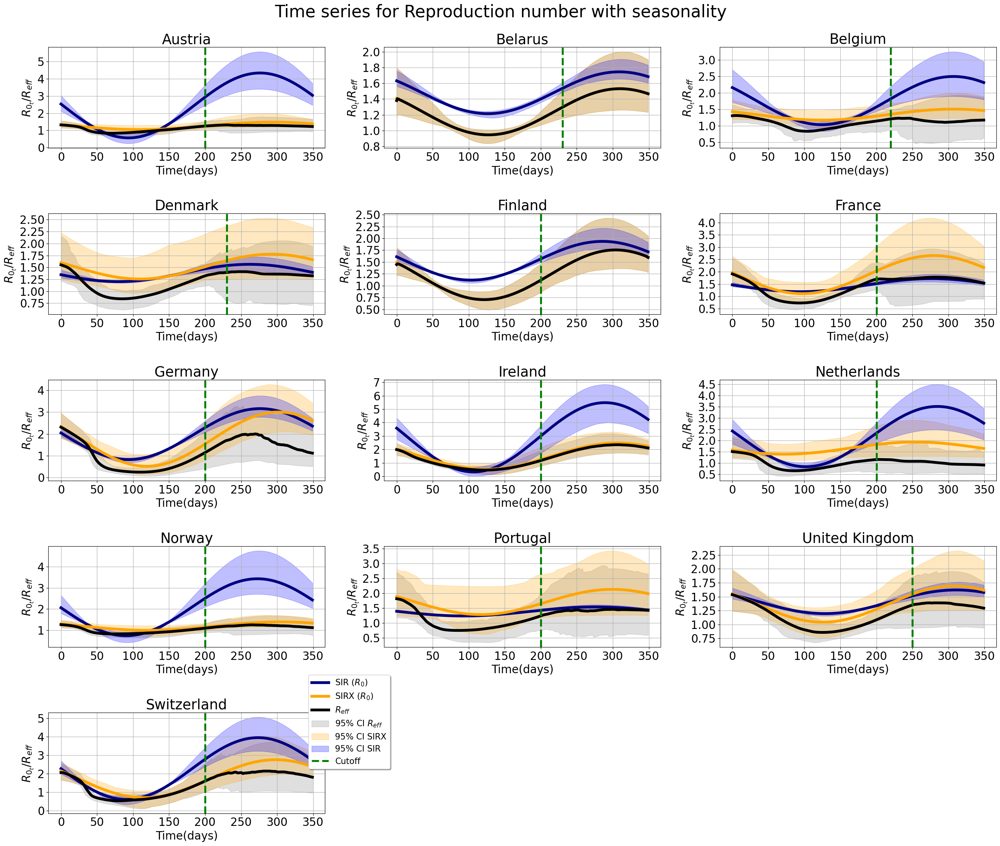

In [28]:
j = 0
plt.figure(figsize=(25,21))
plt.suptitle("Time series for Reproduction number with seasonality", y = 1.0,  fontsize = 30)
for name in parameterErr[:]:
    plt.subplot(5,3,j+1)
    Particle_Sir =  path1 + '/' + name[:-4] + "_sir_latest.csv" 
    Particle_Sirx = path1 + '/' + name[:-7] + "_final_par.csv"
    sir_par = pd.read_csv( Particle_Sir )
    sirx_par = pd.read_csv( Particle_Sirx)
    directory = os.path.join(path1, name[:-7] + "_final_par.csv")  
 
    Particle_Sirx_eta = Pop_negative(directory , 0, 300, Cutoff) 
    Cutoff = cutoff[name]
    freq = 2 * pi / 365.
    SIRX = []
    SIRX1 = []
    for i in range(100):
        beta = sirx_par['beta'][i]
        b = sirx_par['b'][i]
        gamma = sirx_par['gamma'][i]
        phi = sirx_par['phi'][i]
        eps = sirx_par['epsilon'][i]
        R = beta/gamma
        X_eta,Ix_eta = odex(Particle_Sirx_eta[i][1], 350)
        R01 = np.zeros(350)
        R0_eff = np.zeros(350)
        for t in range(350):
            R0_eff[t] = beta*(1 + b*np.cos((t-phi)*freq))*(1-eps*X_eta[t])/gamma
            R01[t] = beta*(1 + b*np.cos((t-phi)*freq))/gamma
        SIRX.append(R01)
        SIRX1.append(R0_eff)
    R0_sirx = np.mean(np.array(SIRX), axis=0)
    sim_I_lowerx, sim_I_upperx = Percentile(SIRX, 2.5, 97.5)
    R0_eff_sirx = np.mean(np.array(SIRX1), axis=0)
    sim_I_lowerx_eff, sim_I_upperx_eff = Percentile(SIRX1, 2.5, 97.5)
    # print(f"{name[:-7].capitalize()} \t {round(max(R0_sirx[:Cutoff]), 3)} $\\in ({round(min(sim_I_lowerx[:Cutoff]),3)}, {round(max(sim_I_upperx[:Cutoff]), 3)})$ " )
    # print(f"Reff \t {round(max(R0_eff_sirx[:Cutoff]), 3)} $\\in ({round(min(sim_I_lowerx_eff[:Cutoff]),3)}, {round(max(sim_I_upperx_eff[:Cutoff]), 3)})$ " )

    SIR = []
    for i in range(100):
        beta = sir_par['beta'][i]
        b = sir_par['b'][i]
        gamma = sir_par['gamma'][i]
        phi = sir_par['phi'][i]
        R = beta/gamma
        R0 = np.zeros(350)
        for t in range(350):
            R0[t] = beta*(1 + b*np.cos((t-phi)*freq))/gamma
        SIR.append(R0)
    R0_sir = np.mean(np.array(SIR), axis=0)
    sim_I_lower, sim_I_upper = Percentile(SIR, 2.5, 97.5)
    # print(f"{name[:-7].capitalize()} \t {round(max(R0_sir[:Cutoff]), 3)} $\\in ({round(min(sim_I_lower[:Cutoff]),3)}, {round(max(sim_I_upper[:Cutoff]), 3)})$ " )
    plt.plot(R0_sir, color = "navy", label = "SIR ($R_0$)", linewidth= 5)
    plt.plot(R0_sirx, color = "orange", label = "SIRX ($R_0$)", linewidth= 5)
    plt.plot(R0_eff_sirx, color = "black", label = "$R_{eff}$", linewidth= 5)
    plt.fill_between(np.arange(len(sim_I_lowerx_eff)), sim_I_lowerx_eff, sim_I_upperx_eff, alpha=0.25, color="grey", label="95% CI $R_{eff}$" )
    plt.fill_between(np.arange(len(sim_I_lowerx)), sim_I_lowerx, sim_I_upperx, alpha=0.25, color="orange", label="95% CI SIRX" )
    plt.fill_between(np.arange(len(sim_I_lower)), sim_I_lower, sim_I_upper, alpha=0.25, color="blue", label="95% CI SIR" )
    plt.axvline(x = Cutoff, color = 'green', linewidth = 3.5, linestyle = "--", label = "Cutoff")

    plt.xlabel("Time(days)", fontsize = 20)
    plt.ylabel("$R_{0_t}/ R_{eff}$", fontsize = 20)
    title = name[:-7].capitalize()
    if title == "Uk":
        title = "United Kingdom"
    plt.title(title, fontsize = 25)
    plt.xticks(fontsize = 20)
    plt.yticks(fontsize = 20)
    plt.grid()
    j = j+1
plt.legend(loc='lower right',  bbox_to_anchor=(1.25, 0.40),
            ncol=1, fancybox=True, shadow=True, fontsize = 15)
plt.tight_layout()
plt.savefig("R0_Reff.jpeg", dpi = 300)
plt.show()